In [1]:
from acfunctions import *
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import astropy.stats as astat
from solartwins import *
import pickle
from IPython.display import Image, display, HTML
import starspot as ss
import starspot.rotation_tools as rt
from starspot import sigma_clipping
import lightkurve as lk
from lightkurve import search_targetpixelfile, search_lightcurvefile
import math
import exoplanet
import eleanor
from astropy.coordinates import SkyCoord
from scipy import interpolate
from tess_kep_funct import *
from tqdm import tqdm
from scipy import misc
from bokeh.models import ColumnDataSource, LabelSet, Whisker
from bokeh.plotting import figure, output_file, show
from bokeh.io import output_notebook
from bokeh.sampledata.autompg import autompg as df

import warnings
warnings.filterwarnings("ignore")

/Users/ilanadoran/opt/anaconda3/lib/python3.7/site-packages/theano/configdefaults.py:560: UserWarning: DeprecationWarning: there is no c++ compiler.This is deprecated and with Theano 0.11 a c++ compiler will be mandatory
  warnings.warn("DeprecationWarning: there is no c++ compiler."
WARNING (theano.configdefaults): g++ not detected ! Theano will be unable to execute optimized C-implementations (for both CPU and GPU) and will default to Python implementations. Performance will be severely degraded. To remove this warning, set Theano flags cxx to an empty string.
WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
rc('text', usetex=False)

In [3]:
output_notebook()

Loading BokehJS ...

In [4]:
def find_m_b(x,y,err): #analytical approach to finding line of best fit 
    #C     
    errorsq = np.square(err)
    C = np.diag(errorsq)

    #A 
    xb = ([1] * len(x))
    mata = []
    for z, txt in enumerate(x):
        mata.append(x[z])
        mata.append(xb[z])
    A= np.matrix(mata).reshape((len(x), 2))

    #plugging in 
    At = np.transpose(A)
    invC = np.linalg.inv(C)
    pt1 = np.dot(At, np.dot(invC,A))
    invpt1= np.linalg.inv(pt1)
    pt2 = np.dot(At, np.dot(invC, y)).T
    cov = np.dot(invpt1, pt2)

    m = float(cov[0])
    b = float(cov[1])
    return m ,b 

def residuals(x, y, error): #residual abundance function
    mborig = find_m_b(x, y, error)
    m = mborig[0]
    b = mborig[1]

    predicted_values = [] #y values from slope
    pv = 0
    for u in x:
        pv = (m*u) + b
        predicted_values.append(pv)
        pv = 0

    prev = np.array(predicted_values)
    abu = np.array(y)
    diff = abu - prev #difference between slope and measured values  
    return diff

In [5]:
#dataset with tess vs kepler IDs
tess_kep = pd.read_csv('data_summary.csv')
tess_short = tess_kep[tess_kep.tess_ffi == True]
cat = pd.read_csv('tics_kics_mcq_rot.txt', names=['tic_id', 'kic_id', 'prot'], delim_whitespace=True)

In [6]:
#importing McQ periods
headers = 'TIC ID', 'KIC ID', 'McQ Periods';  

with open("tics_kics_mcq_rot.txt") as file:
    rot_table = [line.split() for line in file.read().splitlines()]

widths = [max(len(value) for value in col)
for col in zip(*(rot_table + [headers]))]

formatting = '{:{widths[0]}}  {:{widths[1]}}  {:{widths[2]}}'
formatting.format(*headers, widths=widths)
for tics_kics_mcq in rot_table:
    formatting.format(*tics_kics_mcq, widths=widths)

In [7]:
# converting txt file data to arrays
tic_ids = []
mcq_periods = []

for index, row in enumerate(rot_table):
    tic_ids.append(int(rot_table[index][0]))
    mcq_periods.append(float(rot_table[index][2]))

In [8]:
# selecting shortest periods only (<13 days, half a tess cycle)
short_periods = []
tics_short_periods = []

for index, period in enumerate(mcq_periods):
    if period < 13: 
        short_periods.append(period)
        tics_short_periods.append(tic_ids[index])
        
#limiting to the first 60
#short_periods = short_periods[0:61]
#tics_short_periods = tics_short_periods[0:61]

for tess only : change the filters and loop through the first 30 for both heavier and lighter 
filters and then compare to the filters you started with

In [9]:
def eleanor_light_filter(tid, num):
    star = eleanor.Source(tic=tid)
    index = np.where(np.array(tic_ids) == tid)
    mcq_period = short_periods[index[0][0]]
    
    data = eleanor.TargetData(star, do_psf=True, do_pca=True)
    q = data.quality == 0
  
    time = data.time[q] 
    flux_nan = (data.all_raw_flux[0][q])[~np.isnan(data.all_raw_flux[0][q])]
    norm_flux = flux_nan/np.nanmedian(data.all_raw_flux[0][q])
    norm_flux_err = np.sqrt(norm_flux)
    
    resid = residuals(time, norm_flux, norm_flux_err)
    resid = resid[~np.isnan(resid)]
    time = time[~np.isnan(resid)]
    
    try : 
        f = interpolate.interp1d(time, norm_flux)
        xnew = np.arange(time[0], time[-1], 0.1)
        flux = f(xnew) 
        flux_err = np.sqrt(flux)
    
        fig, axs = plt.subplots(2, figsize = (12,10))
        fig.tight_layout(h_pad=6) 
    
        axs[0].plot(time, norm_flux, c='steelblue')
        axs[0].annotate('McQ Period = {0}'.format(mcq_period),
            xy=(np.average(time), np.average(norm_flux)), xycoords='data',
            xytext=(0.1, 0.2), textcoords='offset points')
        axs[0].set_title('Normalized LC for {}'.format(tid))
        axs[0].set_xlabel('Time')
        axs[0].set_ylabel('Flux')
        
        ex_1 = exoplanet.autocorr_estimator(xnew, flux, yerr=flux_err, min_period = 0.1, max_period = 15)
        exo_period = ex_1['peaks'][0]['period']
        axs[1].plot(ex_1['autocorr'][0], ex_1['autocorr'][1])
        axs[1].set_title('Autocorrelation for {0}'.format(tid))
        axs[1].annotate('McQ Period = {0}'.format(mcq_period),
            xy=(np.average(ex_1['autocorr'][0]), np.average(ex_1['autocorr'][1])), xycoords='data',
            xytext=(0.1, 0.2), textcoords='offset points')
        axs[1].annotate('Peak = {0}'.format(np.around(ex_1['peaks'][0]['period'], 3)),
            xy=(10, 0.5), xycoords='data',
            xytext=(0.1, 0.2), textcoords='offset points')
    
        fig.savefig('light_flux_ac_{0}.jpg'.format(num))
        plt.close(fig)
    
    except : 
        print('error')
        exo_period = 0
    
    return(exo_period)

exo_light_filter = []

for each, tic in enumerate(tics_short_periods[0:61]): 
    period = eleanor_light_filter(tic, each)
    exo_light_filter.append(period)

In [10]:
with open('exo_periods_resid.data', 'rb') as filehandle:
    exo_periods = pickle.load(filehandle) 

In [ ]:
indexes_light = np.nonzero(exo_light_filter)[0]

exo_normal_filter = []

for each, value in enumerate(indexes_light): 
    value = int(value)
    exo_normal_filter.append(exo_periods[value])

In [ ]:
exo_filter = []

for each, value in enumerate(indexes_light):
    exo_filter.append(exo_light_filter[value])

In [ ]:
mcq_filter = []

for each, value in enumerate(indexes_light):
    mcq_filter.append(short_periods[value])

In [ ]:
diff_filters = []
for each, value in enumerate(exo_filter):
    diff = np.abs(value - exo_normal_filter[each])
    diff_filters.append(diff)

In [ ]:
plt.scatter(exo_normal_filter, diff_filters)
plt.xlabel('Exo Original Filter')
plt.title('Difference Between Flux Filter Calculations')
plt.ylabel('Difference')
plt.ylim(-5, 15)

In [ ]:
mcq_original_difference = []

for each, value in enumerate(mcq_filter):
    diff = np.abs(value - exo_normal_filter[each])
    mcq_original_difference.append(diff)

In [ ]:
plt.scatter(mcq_filter, mcq_original_difference)
plt.xlabel('McQuillan Period')
plt.title('Difference Between McQ and Original Flux Exo Calculation')
plt.ylabel('Difference')
plt.ylim(-5, 15)

In [ ]:
mcq_new_difference = []

for each, value in enumerate(mcq_filter):
    diff = np.abs(value - exo_filter[each])
    mcq_new_difference.append(diff)

In [ ]:
plt.scatter(mcq_filter, mcq_new_difference)
plt.xlabel('McQuillan Period')
plt.title('Difference Between McQ and New Flux Exo Calculation')
plt.ylabel('Difference')
plt.ylim(-5, 15)

# removing errors from fluxes

# test

In [9]:
star = eleanor.Source(tic=tics_short_periods[3])
data = eleanor.TargetData(star, height=15, width=15, do_psf=True, do_pca=True)
q = data.quality == 0

No eleanor postcard has been made for your target (yet). Using TessCut instead.




100%|██████████| 1241/1241 [00:25<00:00, 48.01it/s]


In [10]:
time = data.time[q]    
norm_flux = data.pca_flux[q]/np.nanmedian(data.pca_flux[q])
norm_flux_err = np.sqrt(norm_flux)
    
resid = residuals(time, norm_flux, norm_flux_err)
resid = resid[~np.isnan(resid)]
time = time[~np.isnan(resid)]
    
#linear interpolation
f = interpolate.interp1d(time, resid)
xnew = np.arange(time[0], time[-1], 0.1)
flux = f(xnew) 
flux_err = np.sqrt(flux)

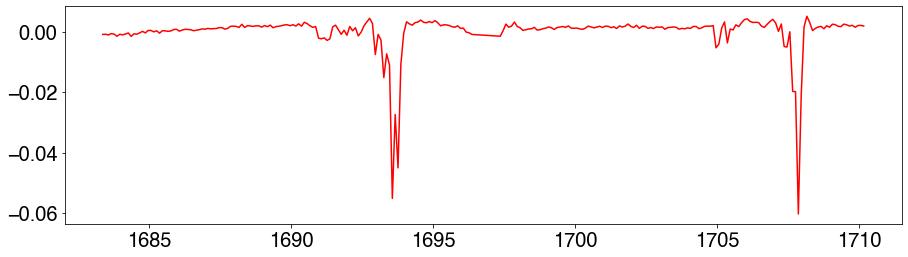

In [11]:
fig, ax = plt.subplots(ncols=1, figsize=(15,4))
ax.plot(xnew, flux, 'r', label='My Version')

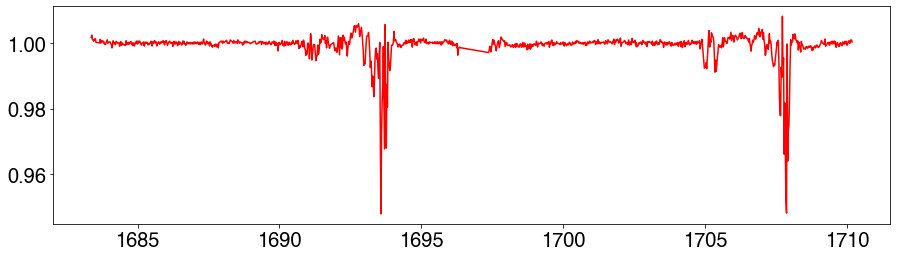

In [12]:
fig, ax = plt.subplots(ncols=1, figsize=(15,4))
ax.plot(data.time[q], data.corr_flux[q]/np.nanmedian(data.corr_flux[q]), 'r', label='Corrected')

Text(0.5, 0, 'Time')

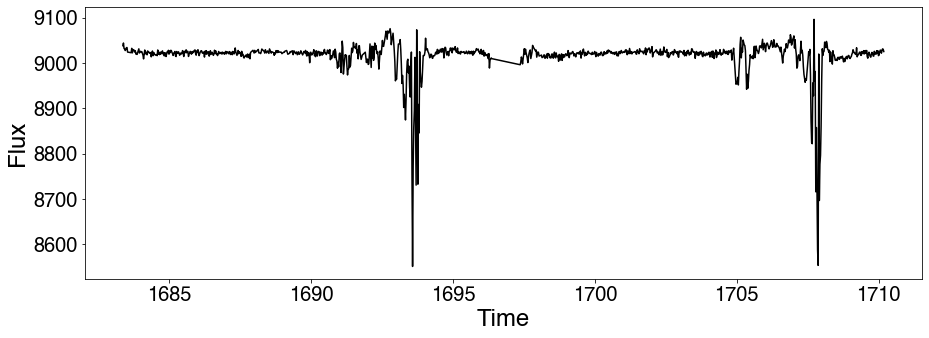

In [13]:
data.quality[q][(data.time[q] > 1693) & (data.time[q] < 1695)] = -8675309
data.quality[q][(data.time[q] > 1706) & (data.time[q] < 1709)] = -8675309


corr_flux = eleanor.TargetData.corrected_flux(data, flux=data.raw_flux)

q = data.quality <= 0.5

plt.figure(figsize=(15,5))
plt.plot(data.time[q], corr_flux[q], 'k')
cor_flux_err = np.sqrt(corr_flux[q])

plt.ylabel('Flux', fontsize=24)
plt.xlabel('Time', fontsize=24)

In [17]:
ex_1 = exoplanet.autocorr_estimator(xnew, flux, yerr= flux_err, min_period = 0.1, max_period = 15)
exo_period = ex_1['peaks'][0]['period']
print(exo_period)

2.64999999999759


In [18]:
print(short_periods[3])

10.69


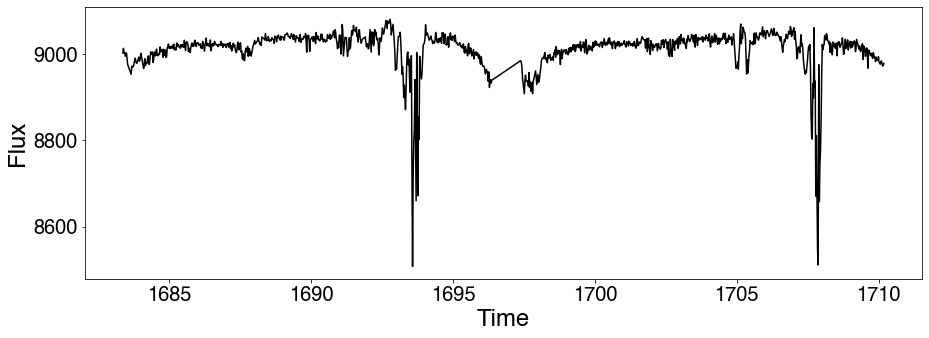

In [16]:
data.cbvs = np.zeros_like(data.cbvs)
data.centroid_xs = np.zeros_like(data.centroid_xs)
data.centroid_ys = np.zeros_like(data.centroid_ys)

corr_flux = eleanor.TargetData.corrected_flux(data, flux=data.raw_flux)

plt.figure(figsize=(15,5))
plt.plot(data.time[q], corr_flux[q], 'k')

plt.ylabel('Flux', fontsize=24)
plt.xlabel('Time', fontsize=24);

# putting it together 

star = eleanor.Source(tic=tics_short_periods[3])
data = eleanor.TargetData(star, height=15, width=15, do_psf=True, do_pca=True)

#q = data.quality == 0
#fig, ax = plt.subplots(ncols=1, figsize=(15,4))
#ax.plot(data.time[q], data.corr_flux[q]/np.nanmedian(data.corr_flux[q]), 'r', label='Corrected')

data.quality[q][(data.time[q] > 1693) & (data.time[q] < 1695)] = -8675309
data.quality[q][(data.time[q] > 1706) & (data.time[q] < 1709)] = -8675309
corr_flux = eleanor.TargetData.corrected_flux(data, flux=data.raw_flux)
q = data.quality <= 0.5

#plt.figure(figsize=(15,5))
#plt.plot(data.time[q], corr_flux[q], 'k')
#cor_flux_err = np.sqrt(corr_flux[q])

ex_1 = exoplanet.autocorr_estimator(data.time[q], corr_flux[q], yerr=cor_flux_err, min_period = 0.1, max_period = 15)
exo_period = ex_1['peaks'][0]['period']
print(exo_period)
print(short_periods[3])

#data.cbvs = np.zeros_like(data.cbvs)
#data.centroid_xs = np.zeros_like(data.centroid_xs)
#data.centroid_ys = np.zeros_like(data.centroid_ys)

#plt.figure(figsize=(15,5))
#plt.plot(data.time[q], corr_flux[q], 'k')

time = data.time[q]    
norm_flux = corr_flux[q]/np.nanmedian(corr_flux[q])
norm_flux_err = np.sqrt(norm_flux)
    
resid = residuals(time, norm_flux, norm_flux_err)
resid = resid[~np.isnan(resid)]
time = time[~np.isnan(resid)]
    
#linear interpolation
f = interpolate.interp1d(time, resid)
xnew = np.arange(time[0], time[-1], 0.1)
flux = f(xnew) 
flux_err = np.sqrt(flux)

fig, ax = plt.subplots(ncols=1, figsize=(15,4))
ax.plot(xnew, flux, 'r', label='My Version')

No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2078.25it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1983.85it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2050.99it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2009.75it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1596.44it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1905.86it/s]


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1950.55it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1837.21it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1936.11it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1962.52it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2017.04it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1927.69it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1749.35it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1916.38it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2015.45it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1241/1241 [01:55<00:00, 10.70it/s]


error
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2046.04it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1999.07it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2061.43it/s]


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1847.11it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2016.71it/s]


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2088.84it/s]


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2076.09it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1815.84it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1970.27it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1658.76it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2148.31it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2143.30it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1960.81it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1963.22it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2006.37it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2092.27it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1986.91it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2034.82it/s]


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2067.38it/s]


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1197/1197 [02:19<00:00,  8.58it/s]


error
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2035.73it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2094.45it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2030.86it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2036.34it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2070.94it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2113.17it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2155.77it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2080.78it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2067.08it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2074.94it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2050.86it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2055.13it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2055.38it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1941.01it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2097.71it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1779.30it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1854.39it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1241/1241 [00:27<00:00, 45.19it/s]


error
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1945.56it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2023.46it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2004.87it/s]


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2076.27it/s]


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 2083.95it/s]


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1940.51it/s]


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1000/1000 [00:00<00:00, 1932.32it/s]


works!


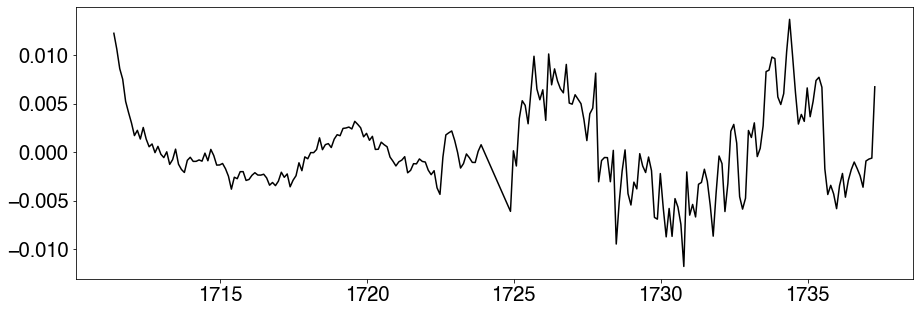

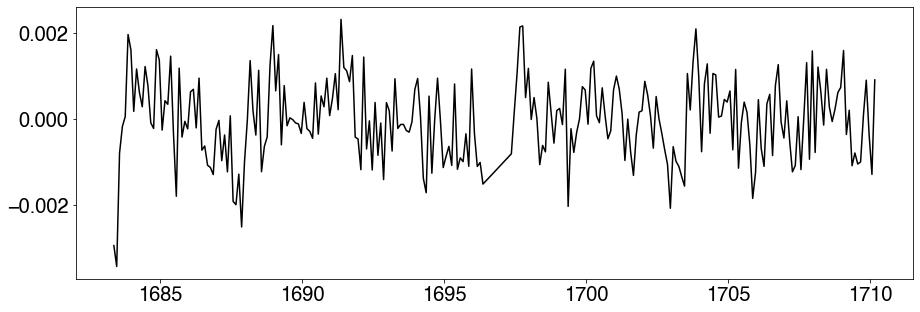

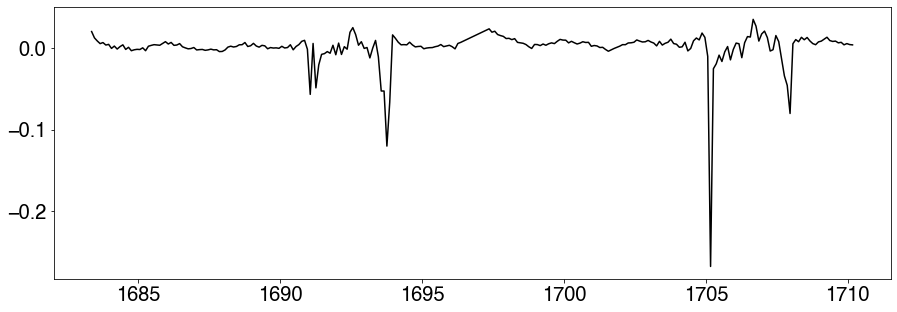

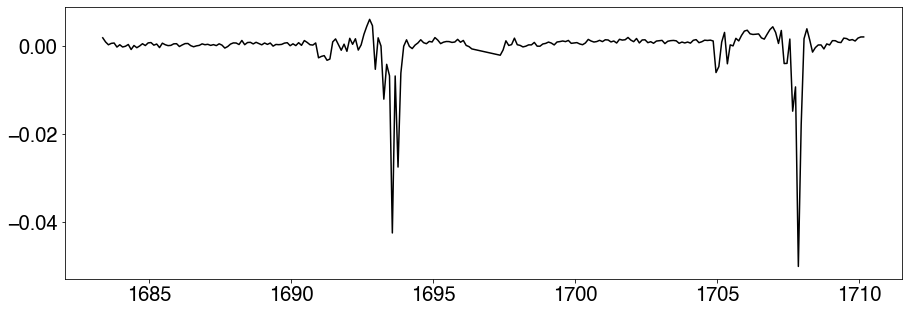

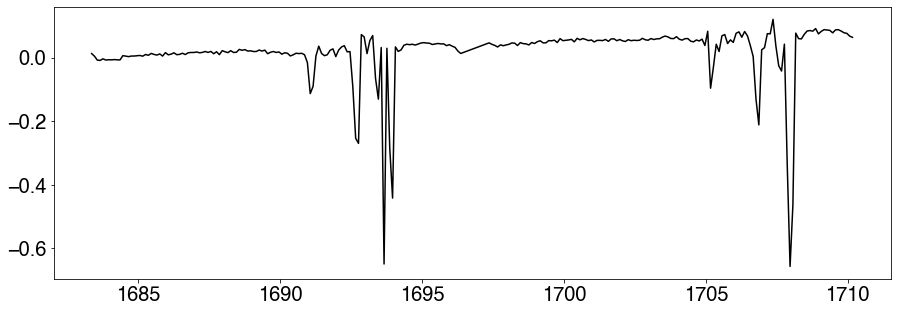

...

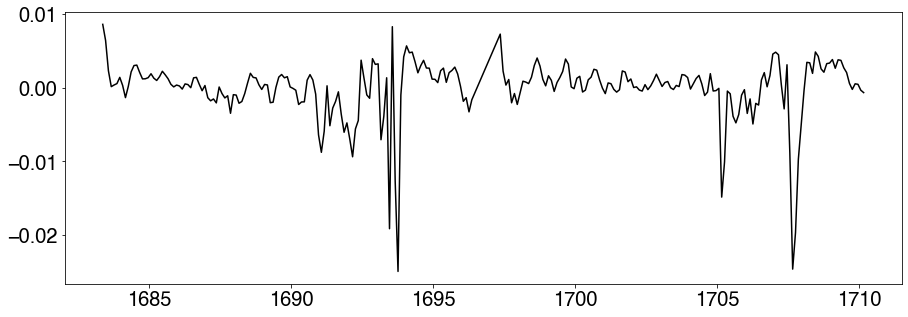

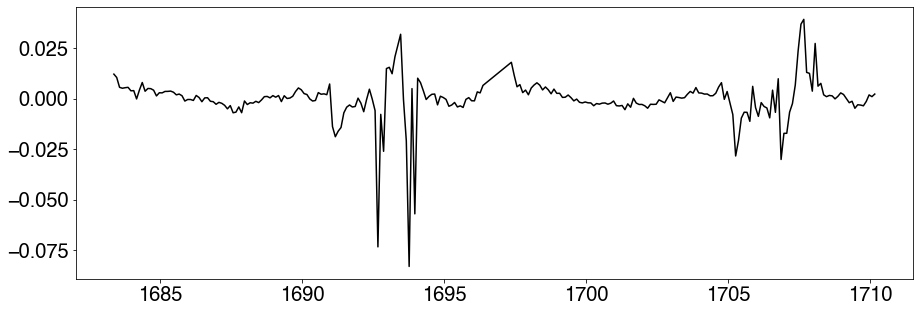

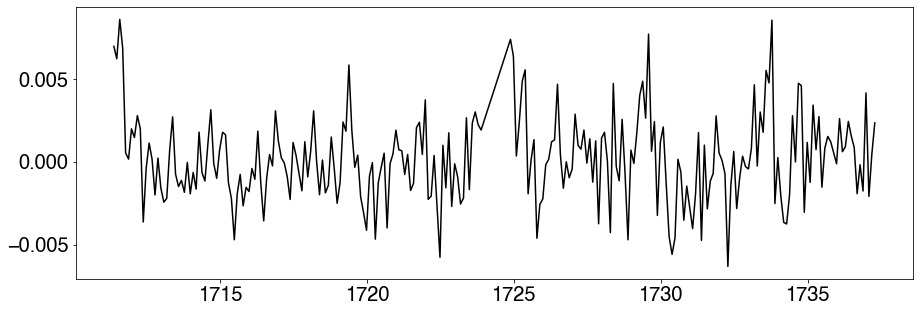

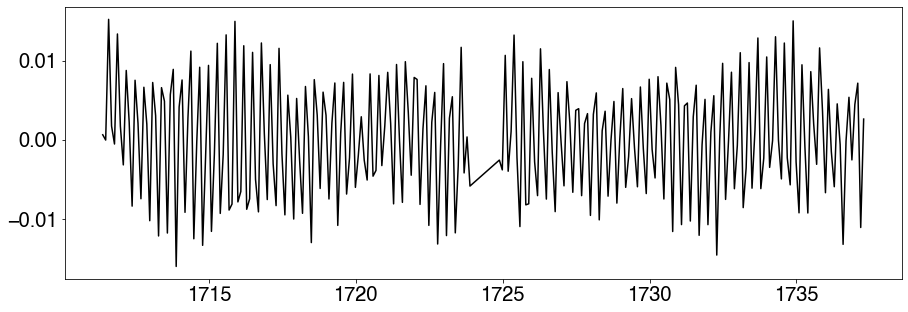

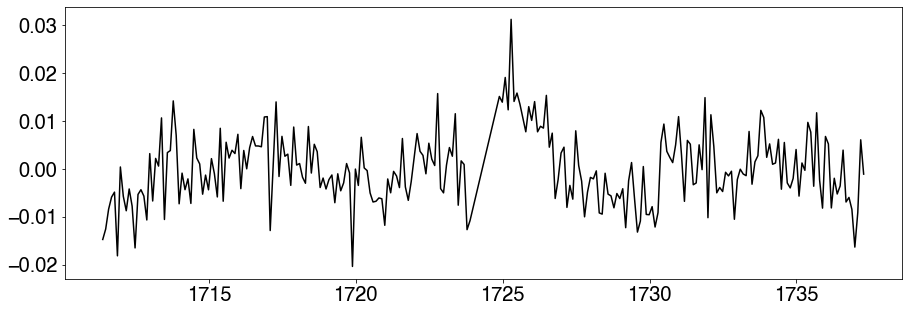

In [26]:
ls_periods_cor_flux = []
pdm_periods_cor_flux = []
exo_periods_cor_flux = []

for each, tic in enumerate(tics_short_periods[0:61]): 
    star = eleanor.Source(tic=tic)
    data = eleanor.TargetData(star, do_psf=True, do_pca=True)
    index = np.where(np.array(tics_short_periods) == tic)
    mcq_period = short_periods[index[0][0]]
    
    q = data.quality <= 0.5
    data.quality[q][(data.time[q] > 1693) & (data.time[q] < 1695)] = -8675309
    data.quality[q][(data.time[q] > 1706) & (data.time[q] < 1709)] = -8675309
    corr_flux = eleanor.TargetData.corrected_flux(data, flux=data.raw_flux)
   
    try: 
        time = data.time[q]    
        norm_flux = corr_flux[q]/np.nanmedian(corr_flux[q])
        norm_flux_err = np.sqrt(norm_flux)
    
        resid = residuals(time, norm_flux, norm_flux_err)
        resid = resid[~np.isnan(resid)]
        time = time[~np.isnan(resid)]
        
        #linear interpolation
        f = interpolate.interp1d(time, resid)
        xnew = np.arange(time[0], time[-1], 0.1)
        flux = f(xnew) 
        flux_err = np.sqrt(flux)
    
    
        plt.figure(figsize=(15,5))
        plt.plot(xnew, flux, 'k')
        fig.savefig('tess_{0}_corr_flux.jpg'.format(each))
        plt.close(fig)

        #exo acf
        ex_1 = exoplanet.autocorr_estimator(xnew, flux, yerr= flux_err, min_period = 0.1, max_period = 15)
        exo_period = ex_1['peaks'][0]['period'] 
        exo_periods_cor_flux.append(exo_period)
        
        
        #lomb-scargle 
        rotate_el = ss.RotationModel(xnew, flux, flux_err)
        ls_period = rotate_el.ls_rotation()
        ls_periods_cor_flux.append(ls_period)
        
        #pdm 
        period_grid = np.linspace(.1, 10, 1000)
        pdm_period, period_err = rotate_el.pdm_rotation(period_grid, pdm_nbins=10)
        pdm_periods_cor_flux.append(pdm_period)
        print('works!')
        
        
    except : 
        print('error')
        ls_periods_cor_flux.append(0)
        pdm_periods_cor_flux.append(0)
        exo_periods_cor_flux.append(0)

with open('ls_periods_cor_flux.data', 'wb') as filehandle:
    pickle.dump(ls_periods_cor_flux, filehandle)

with open('pdm_periods_cor_flux.data', 'wb') as filehandle:
    pickle.dump(pdm_periods_cor_flux, filehandle)

with open('exo_periods_cor_flux.data', 'wb') as filehandle:
    pickle.dump(exo_periods_cor_flux, filehandle)

In [34]:
ls_diff = []
exo_diff = []
pdm_diff = []

for each, value in enumerate(short_periods[0:61]):
    ls_diff.append(np.abs(ls_periods_cor_flux[each]-value))
    exo_diff.append(np.abs(exo_periods_cor_flux[each]-value))
    pdm_diff.append(np.abs(pdm_periods_cor_flux[each]-value))

(array([18.,  9.,  5., 10.,  7.,  4.,  3.,  1.,  3.,  1.]),
 array([2.54382871e-03, 1.36018668e+00, 2.71782953e+00, 4.07547238e+00,
        5.43311523e+00, 6.79075808e+00, 8.14840093e+00, 9.50604378e+00,
        1.08636866e+01, 1.22213295e+01, 1.35789723e+01]),
 <a list of 10 Patch objects>)

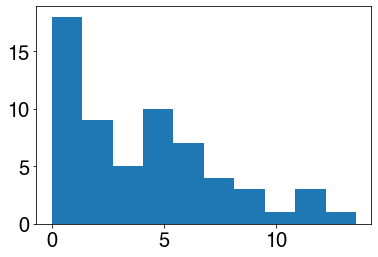

In [36]:
plt.hist(ls_diff)

(array([15., 11.,  8., 12.,  5.,  2.,  4.,  2.,  1.,  1.]),
 array([4.23423423e-03, 1.15512613e+00, 2.30601802e+00, 3.45690991e+00,
        4.60780180e+00, 5.75869369e+00, 6.90958559e+00, 8.06047748e+00,
        9.21136937e+00, 1.03622613e+01, 1.15131532e+01]),
 <a list of 10 Patch objects>)

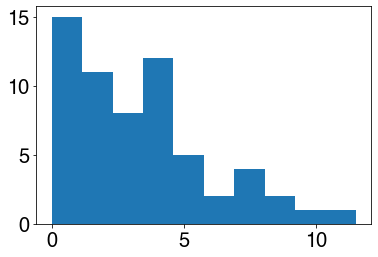

In [38]:
plt.hist(pdm_diff)

(array([19.,  7.,  3.,  5.,  8.,  2.,  9.,  4.,  1.,  3.]),
 array([6.82326868e-04, 1.08734993e+00, 2.17401754e+00, 3.26068514e+00,
        4.34735274e+00, 5.43402035e+00, 6.52068795e+00, 7.60735556e+00,
        8.69402316e+00, 9.78069076e+00, 1.08673584e+01]),
 <a list of 10 Patch objects>)

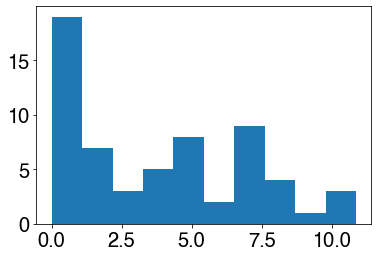

In [37]:
plt.hist(exo_diff)

# data.cbvs 

No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:01<29:30,  1.48s/it]

  0%|          | 5/1197 [00:01<20:43,  1.04s/it]

  1%|          | 10/1197 [00:01<14:35,  1.36it/s]

  1%|▏         | 15/1197 [00:01<10:18,  1.91it/s]

  2%|▏         | 19/1197 [00:01<07:21,  2.67it/s]

  2%|▏         | 24/1197 [00:02<05:15,  3.72it/s]

  2%|▏         | 28/1197 [00:02<03:49,  5.10it/s]

  3%|▎         | 33/1197 [00:02<02:46,  6.98it/s]

  3%|▎         | 37/1197 [00:02<02:06,  9.20it/s]

  3%|▎         | 41/1197 [00:02<01:37, 11.90it/s]

  4%|▍         | 45/1197 [00:02<01:24, 13.59it/s]

  4%|▍         | 49/1197 [00:02<01:09, 16.62it/s]

  5%|▍         | 54/1197 [00:02<00:55, 20.62it/s]

  5%|▌         | 60/1197 [00:02<00:44, 25.40it/s]

  6%|▌         | 66/1197 [00:03<00:37, 30.47it/s]

  6%|▌         | 72/1197 [00:03<00:32, 34.93it/s]

  7%|▋         | 78/1197 [00:03<00:28, 39.41it/s]

  7%|▋         | 84/1197 [00:03<00:25, 43.53it/s]

  8%|▊         | 90/1197 [00:03<00:23, 4

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1241 [00:00<?, ?it/s]

  0%|          | 1/1241 [00:01<31:00,  1.50s/it]

  1%|          | 7/1241 [00:01<21:42,  1.06s/it]

  1%|          | 13/1241 [00:01<15:13,  1.34it/s]

  2%|▏         | 19/1241 [00:01<10:42,  1.90it/s]

  2%|▏         | 26/1241 [00:01<07:33,  2.68it/s]

  3%|▎         | 32/1241 [00:02<05:22,  3.75it/s]

  3%|▎         | 38/1241 [00:02<03:50,  5.21it/s]

  4%|▎         | 44/1241 [00:02<02:48,  7.09it/s]

  4%|▍         | 50/1241 [00:02<02:03,  9.61it/s]

  5%|▍         | 56/1241 [00:02<01:32, 12.76it/s]

  5%|▍         | 62/1241 [00:02<01:11, 16.60it/s]

  6%|▌         | 69/1241 [00:02<00:54, 21.43it/s]

  6%|▌         | 75/1241 [00:02<00:44, 26.21it/s]

  7%|▋         | 81/1241 [00:02<00:37, 31.30it/s]

  7%|▋         | 87/1241 [00:03<00:31, 36.28it/s]

  7%|▋         | 93/1241 [00:03<00:28, 40.93it/s]

  8%|▊         | 99/1241 [00:03<00:25, 44.52it/s]

  8%|▊         | 105/1241 [00:03<00:23, 47.52it/s]

  9%|▉         | 111/1241 [00:03<00:22,

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1241 [00:00<?, ?it/s]

  0%|          | 1/1241 [00:01<34:20,  1.66s/it]

  1%|          | 7/1241 [00:01<24:02,  1.17s/it]

  1%|          | 12/1241 [00:01<16:53,  1.21it/s]

  1%|▏         | 18/1241 [00:01<11:52,  1.72it/s]

  2%|▏         | 25/1241 [00:02<08:21,  2.42it/s]

  2%|▏         | 30/1241 [00:02<05:57,  3.39it/s]

  3%|▎         | 35/1241 [00:02<04:16,  4.70it/s]

  3%|▎         | 40/1241 [00:02<03:06,  6.43it/s]

  4%|▎         | 46/1241 [00:02<02:16,  8.77it/s]

  4%|▍         | 52/1241 [00:02<01:41, 11.74it/s]

  5%|▍         | 58/1241 [00:02<01:17, 15.28it/s]

  5%|▌         | 64/1241 [00:02<01:00, 19.61it/s]

  6%|▌         | 70/1241 [00:02<00:48, 24.38it/s]

  6%|▌         | 76/1241 [00:03<00:39, 29.36it/s]

  7%|▋         | 82/1241 [00:03<00:33, 34.28it/s]

  7%|▋         | 88/1241 [00:03<00:30, 37.62it/s]

  8%|▊         | 94/1241 [00:03<00:27, 42.28it/s]

  8%|▊         | 100/1241 [00:03<00:24, 45.65it/s]

  9%|▊         | 106/1241 [00:03<00:23,

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1241 [00:00<?, ?it/s]

  0%|          | 1/1241 [00:01<36:21,  1.76s/it]

  1%|          | 7/1241 [00:01<25:25,  1.24s/it]

  1%|          | 12/1241 [00:01<17:51,  1.15it/s]

  1%|▏         | 18/1241 [00:02<12:32,  1.63it/s]

  2%|▏         | 24/1241 [00:02<08:50,  2.29it/s]

  2%|▏         | 30/1241 [00:02<06:16,  3.22it/s]

  3%|▎         | 35/1241 [00:02<04:30,  4.46it/s]

  3%|▎         | 40/1241 [00:02<03:15,  6.13it/s]

  4%|▎         | 46/1241 [00:02<02:23,  8.36it/s]

  4%|▍         | 52/1241 [00:02<01:45, 11.23it/s]

  5%|▍         | 58/1241 [00:02<01:20, 14.67it/s]

  5%|▌         | 64/1241 [00:02<01:03, 18.59it/s]

  6%|▌         | 70/1241 [00:03<00:50, 23.11it/s]

  6%|▌         | 76/1241 [00:03<00:41, 27.85it/s]

  7%|▋         | 82/1241 [00:03<00:35, 32.94it/s]

  7%|▋         | 88/1241 [00:03<00:31, 36.42it/s]

  8%|▊         | 94/1241 [00:03<00:28, 40.32it/s]

  8%|▊         | 100/1241 [00:03<00:25, 44.54it/s]

  9%|▊         | 106/1241 [00:03<00:24,

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1241 [00:00<?, ?it/s]

  0%|          | 1/1241 [00:01<37:10,  1.80s/it]

  0%|          | 6/1241 [00:01<26:02,  1.27s/it]

  1%|          | 11/1241 [00:02<18:17,  1.12it/s]

  1%|▏         | 16/1241 [00:02<12:53,  1.58it/s]

  2%|▏         | 21/1241 [00:02<09:06,  2.23it/s]

  2%|▏         | 27/1241 [00:02<06:27,  3.13it/s]

  3%|▎         | 32/1241 [00:02<04:38,  4.35it/s]

  3%|▎         | 37/1241 [00:02<03:21,  5.98it/s]

  3%|▎         | 42/1241 [00:02<02:27,  8.11it/s]

  4%|▍         | 47/1241 [00:02<01:51, 10.69it/s]

  4%|▍         | 52/1241 [00:02<01:25, 13.92it/s]

  5%|▍         | 57/1241 [00:02<01:07, 17.46it/s]

  5%|▍         | 62/1241 [00:03<00:54, 21.64it/s]

  5%|▌         | 67/1241 [00:03<00:45, 25.97it/s]

  6%|▌         | 73/1241 [00:03<00:37, 31.12it/s]

  6%|▋         | 79/1241 [00:03<00:32, 35.71it/s]

  7%|▋         | 85/1241 [00:03<00:28, 40.48it/s]

  7%|▋         | 91/1241 [00:03<00:27, 42.58it/s]

  8%|▊         | 97/1241 [00:03<00:24, 4

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1241 [00:00<?, ?it/s]

  0%|          | 1/1241 [00:01<40:32,  1.96s/it]

  1%|          | 7/1241 [00:02<28:20,  1.38s/it]

  1%|          | 13/1241 [00:02<19:51,  1.03it/s]

  2%|▏         | 19/1241 [00:02<13:56,  1.46it/s]

  2%|▏         | 25/1241 [00:02<09:49,  2.06it/s]

  2%|▏         | 31/1241 [00:02<06:56,  2.90it/s]

  3%|▎         | 37/1241 [00:02<04:56,  4.06it/s]

  3%|▎         | 43/1241 [00:02<03:32,  5.63it/s]

  4%|▍         | 49/1241 [00:02<02:34,  7.71it/s]

  4%|▍         | 55/1241 [00:02<01:53, 10.41it/s]

  5%|▍         | 61/1241 [00:03<01:25, 13.79it/s]

  5%|▌         | 67/1241 [00:03<01:05, 17.84it/s]

  6%|▌         | 73/1241 [00:03<00:52, 22.39it/s]

  6%|▋         | 79/1241 [00:03<00:42, 27.18it/s]

  7%|▋         | 85/1241 [00:03<00:36, 32.02it/s]

  7%|▋         | 91/1241 [00:03<00:31, 36.58it/s]

  8%|▊         | 97/1241 [00:03<00:27, 41.24it/s]

  8%|▊         | 103/1241 [00:03<00:25, 44.56it/s]

  9%|▉         | 110/1241 [00:03<00:23,

fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1241 [00:00<?, ?it/s]

  0%|          | 1/1241 [00:02<45:26,  2.20s/it]

  0%|          | 3/1241 [00:02<32:03,  1.55s/it]

  1%|          | 8/1241 [00:02<22:30,  1.10s/it]

  1%|          | 14/1241 [00:02<15:47,  1.30it/s]

  2%|▏         | 19/1241 [00:02<11:08,  1.83it/s]

  2%|▏         | 25/1241 [00:02<07:51,  2.58it/s]

  2%|▏         | 31/1241 [00:02<05:35,  3.61it/s]

  3%|▎         | 36/1241 [00:02<04:01,  4.99it/s]

  3%|▎         | 42/1241 [00:03<02:55,  6.85it/s]

  4%|▍         | 47/1241 [00:03<02:09,  9.21it/s]

  4%|▍         | 52/1241 [00:03<01:38, 12.10it/s]

  5%|▍         | 57/1241 [00:03<01:17, 15.28it/s]

  5%|▌         | 63/1241 [00:03<01:00, 19.52it/s]

  5%|▌         | 68/1241 [00:03<00:50, 23.23it/s]

  6%|▌         | 73/1241 [00:03<00:44, 26.39it/s]

  6%|▋         | 78/1241 [00:03<00:40, 29.03it/s]

  7%|▋         | 83/1241 [00:04<00:35, 32.26it/s]

  7%|▋         | 88/1241 [00:04<00:33, 34.21it/s]

  7%|▋         | 93/1241 [00:04<00:34, 33

 91%|█████████ | 1129/1241 [00:38<00:03, 29.32it/s]

 91%|█████████▏| 1133/1241 [00:38<00:03, 28.48it/s]

 92%|█████████▏| 1136/1241 [00:38<00:04, 24.76it/s]

 92%|█████████▏| 1139/1241 [00:38<00:03, 25.67it/s]

 92%|█████████▏| 1142/1241 [00:38<00:04, 24.43it/s]

 92%|█████████▏| 1145/1241 [00:38<00:04, 23.79it/s]

 93%|█████████▎| 1148/1241 [00:38<00:03, 23.42it/s]

 93%|█████████▎| 1151/1241 [00:39<00:04, 22.37it/s]

 93%|█████████▎| 1154/1241 [00:39<00:03, 23.25it/s]

 93%|█████████▎| 1157/1241 [00:39<00:03, 23.81it/s]

 93%|█████████▎| 1160/1241 [00:39<00:03, 23.10it/s]

 94%|█████████▎| 1163/1241 [00:39<00:03, 23.71it/s]

 94%|█████████▍| 1166/1241 [00:39<00:03, 24.87it/s]

 94%|█████████▍| 1169/1241 [00:39<00:02, 24.57it/s]

 94%|█████████▍| 1172/1241 [00:39<00:02, 24.70it/s]

 95%|█████████▍| 1175/1241 [00:40<00:02, 25.74it/s]

 95%|█████████▌| 1179/1241 [00:40<00:02, 27.39it/s]

 95%|█████████▌| 1182/1241 [00:40<00:02, 26.27it/s]

 95%|█████████▌| 1185/1241 [00:40<00:02, 25.87

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:02<48:16,  2.42s/it]

  0%|          | 5/1197 [00:02<33:51,  1.70s/it]

  1%|          | 9/1197 [00:02<23:47,  1.20s/it]

  1%|          | 14/1197 [00:02<16:43,  1.18it/s]

  1%|▏         | 17/1197 [00:02<11:53,  1.65it/s]

  2%|▏         | 21/1197 [00:02<08:26,  2.32it/s]

  2%|▏         | 25/1197 [00:03<06:03,  3.22it/s]

  2%|▏         | 29/1197 [00:03<04:22,  4.44it/s]

  3%|▎         | 33/1197 [00:03<03:12,  6.05it/s]

  3%|▎         | 38/1197 [00:03<02:22,  8.16it/s]

  4%|▎         | 42/1197 [00:03<01:48, 10.64it/s]

  4%|▍         | 46/1197 [00:03<01:26, 13.35it/s]

  4%|▍         | 50/1197 [00:03<01:14, 15.43it/s]

  5%|▍         | 54/1197 [00:03<01:02, 18.41it/s]

  5%|▍         | 58/1197 [00:04<01:03, 18.07it/s]

  5%|▌         | 61/1197 [00:04<00:58, 19.45it/s]

  5%|▌         | 65/1197 [00:04<00:49, 22.77it/s]

  6%|▌         | 69/1197 [00:04<00:43, 25.66it/s]

  6%|▌         | 73/1197 [00:04<00:39, 28

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:02<42:59,  2.16s/it]

  1%|          | 6/1197 [00:02<30:05,  1.52s/it]

  1%|          | 12/1197 [00:02<21:03,  1.07s/it]

  2%|▏         | 18/1197 [00:02<14:46,  1.33it/s]

  2%|▏         | 24/1197 [00:02<10:23,  1.88it/s]

  2%|▏         | 29/1197 [00:02<07:21,  2.64it/s]

  3%|▎         | 34/1197 [00:02<05:14,  3.69it/s]

  3%|▎         | 40/1197 [00:02<03:45,  5.13it/s]

  4%|▍         | 45/1197 [00:03<02:44,  6.98it/s]

  4%|▍         | 50/1197 [00:03<02:03,  9.28it/s]

  5%|▍         | 56/1197 [00:03<01:32, 12.33it/s]

  5%|▌         | 62/1197 [00:03<01:11, 15.95it/s]

  6%|▌         | 67/1197 [00:03<00:56, 19.90it/s]

  6%|▌         | 73/1197 [00:03<00:45, 24.77it/s]

  7%|▋         | 79/1197 [00:03<00:37, 30.01it/s]

  7%|▋         | 86/1197 [00:03<00:31, 35.44it/s]

  8%|▊         | 92/1197 [00:03<00:27, 39.72it/s]

  8%|▊         | 98/1197 [00:04<00:25, 42.70it/s]

  9%|▊         | 104/1197 [00:04<00:23, 

fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:02<50:15,  2.52s/it]

  1%|          | 6/1197 [00:02<35:09,  1.77s/it]

  1%|          | 11/1197 [00:02<24:38,  1.25s/it]

  1%|▏         | 16/1197 [00:02<17:18,  1.14it/s]

  2%|▏         | 22/1197 [00:02<12:08,  1.61it/s]

  2%|▏         | 27/1197 [00:03<08:35,  2.27it/s]

  3%|▎         | 33/1197 [00:03<06:05,  3.19it/s]

  3%|▎         | 39/1197 [00:03<04:20,  4.44it/s]

  4%|▎         | 44/1197 [00:03<03:09,  6.09it/s]

  4%|▍         | 50/1197 [00:03<02:18,  8.31it/s]

  5%|▍         | 56/1197 [00:03<01:42, 11.14it/s]

  5%|▌         | 62/1197 [00:03<01:17, 14.66it/s]

  6%|▌         | 68/1197 [00:03<00:59, 18.90it/s]

  6%|▌         | 74/1197 [00:03<00:48, 23.26it/s]

  7%|▋         | 80/1197 [00:04<00:39, 28.27it/s]

  7%|▋         | 86/1197 [00:04<00:33, 33.06it/s]

  8%|▊         | 92/1197 [00:04<00:29, 37.69it/s]

  8%|▊         | 98/1197 [00:04<00:26, 40.72it/s]

  9%|▊         | 104/1197 [00:04<00:24, 

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:03<1:01:39,  3.09s/it]

  0%|          | 2/1197 [00:03<44:13,  2.22s/it]  

  0%|          | 5/1197 [00:03<31:08,  1.57s/it]

  1%|          | 7/1197 [00:03<22:05,  1.11s/it]

  1%|          | 9/1197 [00:03<15:46,  1.25it/s]

  1%|          | 11/1197 [00:03<11:23,  1.74it/s]

  1%|          | 13/1197 [00:03<08:23,  2.35it/s]

  1%|▏         | 17/1197 [00:04<06:02,  3.25it/s]

  2%|▏         | 19/1197 [00:04<04:42,  4.17it/s]

  2%|▏         | 22/1197 [00:04<03:30,  5.58it/s]

  2%|▏         | 24/1197 [00:04<02:45,  7.11it/s]

  2%|▏         | 27/1197 [00:04<02:11,  8.88it/s]

  3%|▎         | 30/1197 [00:04<01:51, 10.51it/s]

  3%|▎         | 34/1197 [00:04<01:28, 13.14it/s]

  3%|▎         | 37/1197 [00:04<01:17, 15.04it/s]

  3%|▎         | 40/1197 [00:05<01:15, 15.29it/s]

  4%|▎         | 43/1197 [00:05<01:12, 15.91it/s]

  4%|▍         | 45/1197 [00:05<01:12, 15.80it/s]

  4%|▍         | 47/1197 [00:05<01:24, 

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:02<47:09,  2.37s/it]

  1%|          | 6/1197 [00:02<33:00,  1.66s/it]

  1%|          | 11/1197 [00:02<23:07,  1.17s/it]

  1%|▏         | 17/1197 [00:02<16:13,  1.21it/s]

  2%|▏         | 22/1197 [00:02<11:25,  1.71it/s]

  2%|▏         | 28/1197 [00:02<08:04,  2.41it/s]

  3%|▎         | 34/1197 [00:03<05:43,  3.39it/s]

  3%|▎         | 40/1197 [00:03<04:05,  4.71it/s]

  4%|▍         | 46/1197 [00:03<02:56,  6.51it/s]

  4%|▍         | 52/1197 [00:03<02:09,  8.84it/s]

  5%|▍         | 58/1197 [00:03<01:36, 11.82it/s]

  5%|▌         | 64/1197 [00:03<01:13, 15.47it/s]

  6%|▌         | 70/1197 [00:03<00:57, 19.68it/s]

  6%|▋         | 76/1197 [00:03<00:46, 24.28it/s]

  7%|▋         | 82/1197 [00:03<00:37, 29.46it/s]

  7%|▋         | 88/1197 [00:04<00:32, 33.82it/s]

  8%|▊         | 94/1197 [00:04<00:28, 38.56it/s]

  8%|▊         | 100/1197 [00:04<00:25, 42.83it/s]

  9%|▉         | 106/1197 [00:04<00:24,

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:02<47:42,  2.39s/it]

  0%|          | 4/1197 [00:02<33:31,  1.69s/it]

  1%|          | 8/1197 [00:02<23:32,  1.19s/it]

  1%|          | 13/1197 [00:02<16:31,  1.19it/s]

  2%|▏         | 18/1197 [00:02<11:39,  1.69it/s]

  2%|▏         | 23/1197 [00:02<08:15,  2.37it/s]

  2%|▏         | 28/1197 [00:03<05:52,  3.32it/s]

  3%|▎         | 33/1197 [00:03<04:13,  4.59it/s]

  3%|▎         | 38/1197 [00:03<03:04,  6.29it/s]

  4%|▎         | 43/1197 [00:03<02:16,  8.46it/s]

  4%|▍         | 48/1197 [00:03<01:42, 11.17it/s]

  4%|▍         | 53/1197 [00:03<01:19, 14.39it/s]

  5%|▍         | 58/1197 [00:03<01:03, 18.05it/s]

  5%|▌         | 63/1197 [00:03<00:52, 21.75it/s]

  6%|▌         | 68/1197 [00:03<00:44, 25.56it/s]

  6%|▌         | 73/1197 [00:04<00:38, 29.33it/s]

  7%|▋         | 78/1197 [00:04<00:34, 32.85it/s]

  7%|▋         | 83/1197 [00:04<00:31, 35.69it/s]

  7%|▋         | 88/1197 [00:04<00:29, 37

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:02<48:37,  2.44s/it]

  1%|          | 7/1197 [00:02<33:58,  1.71s/it]

  1%|          | 13/1197 [00:02<23:46,  1.20s/it]

  2%|▏         | 19/1197 [00:02<16:39,  1.18it/s]

  2%|▏         | 25/1197 [00:02<11:42,  1.67it/s]

  3%|▎         | 30/1197 [00:02<08:16,  2.35it/s]

  3%|▎         | 36/1197 [00:03<05:52,  3.29it/s]

  4%|▎         | 42/1197 [00:03<04:12,  4.58it/s]

  4%|▍         | 47/1197 [00:03<03:02,  6.30it/s]

  4%|▍         | 52/1197 [00:03<02:14,  8.52it/s]

  5%|▍         | 58/1197 [00:03<01:40, 11.36it/s]

  5%|▌         | 64/1197 [00:03<01:15, 14.94it/s]

  6%|▌         | 70/1197 [00:03<00:58, 19.16it/s]

  6%|▋         | 76/1197 [00:03<00:46, 23.88it/s]

  7%|▋         | 82/1197 [00:03<00:39, 28.47it/s]

  7%|▋         | 88/1197 [00:04<00:33, 33.25it/s]

  8%|▊         | 94/1197 [00:04<00:29, 37.96it/s]

  8%|▊         | 100/1197 [00:04<00:26, 41.40it/s]

  9%|▉         | 106/1197 [00:04<00:24,

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1241 [00:00<?, ?it/s]

  0%|          | 1/1241 [00:02<52:20,  2.53s/it]

  0%|          | 6/1241 [00:02<36:37,  1.78s/it]

  1%|          | 12/1241 [00:02<25:37,  1.25s/it]

  1%|▏         | 17/1241 [00:02<17:59,  1.13it/s]

  2%|▏         | 22/1241 [00:02<12:39,  1.60it/s]

  2%|▏         | 27/1241 [00:03<08:57,  2.26it/s]

  3%|▎         | 33/1241 [00:03<06:21,  3.17it/s]

  3%|▎         | 39/1241 [00:03<04:32,  4.42it/s]

  4%|▎         | 44/1241 [00:03<03:17,  6.05it/s]

  4%|▍         | 50/1241 [00:03<02:23,  8.27it/s]

  5%|▍         | 56/1241 [00:03<01:47, 11.07it/s]

  5%|▍         | 62/1241 [00:03<01:21, 14.41it/s]

  5%|▌         | 68/1241 [00:03<01:03, 18.37it/s]

  6%|▌         | 74/1241 [00:03<00:51, 22.65it/s]

  6%|▋         | 80/1241 [00:04<00:42, 27.22it/s]

  7%|▋         | 86/1241 [00:04<00:36, 32.02it/s]

  7%|▋         | 92/1241 [00:04<00:32, 35.43it/s]

  8%|▊         | 98/1241 [00:04<00:29, 38.71it/s]

  8%|▊         | 104/1241 [00:04<00:27, 

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1241 [00:00<?, ?it/s]

  0%|          | 1/1241 [00:02<54:09,  2.62s/it]

  0%|          | 6/1241 [00:02<37:53,  1.84s/it]

  1%|          | 12/1241 [00:02<26:30,  1.29s/it]

  1%|▏         | 18/1241 [00:02<18:35,  1.10it/s]

  2%|▏         | 24/1241 [00:03<13:03,  1.55it/s]

  2%|▏         | 30/1241 [00:03<09:12,  2.19it/s]

  3%|▎         | 36/1241 [00:03<06:31,  3.08it/s]

  3%|▎         | 42/1241 [00:03<04:39,  4.29it/s]

  4%|▍         | 47/1241 [00:03<03:22,  5.90it/s]

  4%|▍         | 52/1241 [00:03<02:28,  8.00it/s]

  5%|▍         | 57/1241 [00:03<01:51, 10.65it/s]

  5%|▍         | 62/1241 [00:03<01:25, 13.80it/s]

  5%|▌         | 67/1241 [00:03<01:07, 17.28it/s]

  6%|▌         | 72/1241 [00:04<00:54, 21.36it/s]

  6%|▌         | 77/1241 [00:04<00:45, 25.75it/s]

  7%|▋         | 82/1241 [00:04<00:38, 30.01it/s]

  7%|▋         | 87/1241 [00:04<00:34, 32.99it/s]

  7%|▋         | 92/1241 [00:04<00:31, 36.34it/s]

  8%|▊         | 98/1241 [00:04<00:28, 4

 58%|█████▊    | 720/1241 [00:44<01:21,  6.41it/s]

 58%|█████▊    | 721/1241 [00:44<01:22,  6.29it/s]

 58%|█████▊    | 722/1241 [00:44<01:22,  6.32it/s]

 58%|█████▊    | 723/1241 [00:44<01:21,  6.39it/s]

 58%|█████▊    | 724/1241 [00:45<01:20,  6.45it/s]

 58%|█████▊    | 725/1241 [00:45<01:19,  6.47it/s]

 59%|█████▊    | 726/1241 [00:45<01:19,  6.45it/s]

 59%|█████▊    | 727/1241 [00:45<01:19,  6.44it/s]

 59%|█████▊    | 728/1241 [00:45<01:20,  6.41it/s]

 59%|█████▊    | 729/1241 [00:45<01:19,  6.44it/s]

 59%|█████▉    | 730/1241 [00:45<01:18,  6.48it/s]

 59%|█████▉    | 731/1241 [00:46<01:18,  6.49it/s]

 59%|█████▉    | 732/1241 [00:46<01:18,  6.49it/s]

 59%|█████▉    | 733/1241 [00:46<01:18,  6.47it/s]

 59%|█████▉    | 734/1241 [00:46<01:17,  6.50it/s]

 59%|█████▉    | 735/1241 [00:46<01:18,  6.45it/s]

 59%|█████▉    | 736/1241 [00:46<01:17,  6.50it/s]

 59%|█████▉    | 737/1241 [00:47<01:17,  6.53it/s]

 59%|█████▉    | 738/1241 [00:47<01:17,  6.53it/s]

 60%|█████▉ 

 81%|████████  | 1002/1241 [01:28<00:37,  6.33it/s]

 81%|████████  | 1003/1241 [01:29<00:37,  6.36it/s]

 81%|████████  | 1004/1241 [01:29<00:37,  6.30it/s]

 81%|████████  | 1005/1241 [01:29<00:37,  6.32it/s]

 81%|████████  | 1006/1241 [01:29<00:36,  6.40it/s]

 81%|████████  | 1007/1241 [01:29<00:36,  6.42it/s]

 81%|████████  | 1008/1241 [01:29<00:36,  6.45it/s]

 81%|████████▏ | 1009/1241 [01:29<00:35,  6.45it/s]

 81%|████████▏ | 1010/1241 [01:30<00:35,  6.44it/s]

 81%|████████▏ | 1011/1241 [01:30<00:35,  6.45it/s]

 82%|████████▏ | 1012/1241 [01:30<00:35,  6.40it/s]

 82%|████████▏ | 1013/1241 [01:30<00:36,  6.30it/s]

 82%|████████▏ | 1014/1241 [01:30<00:35,  6.35it/s]

 82%|████████▏ | 1015/1241 [01:30<00:35,  6.40it/s]

 82%|████████▏ | 1016/1241 [01:31<00:35,  6.37it/s]

 82%|████████▏ | 1017/1241 [01:31<00:35,  6.40it/s]

 82%|████████▏ | 1018/1241 [01:31<00:42,  5.29it/s]

 82%|████████▏ | 1019/1241 [01:31<00:41,  5.32it/s]

 82%|████████▏ | 1020/1241 [01:31<00:39,  5.61

error
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1241 [00:00<?, ?it/s]

  0%|          | 1/1241 [00:02<53:51,  2.61s/it]

  0%|          | 6/1241 [00:02<37:40,  1.83s/it]

  1%|          | 12/1241 [00:02<26:21,  1.29s/it]

  1%|▏         | 18/1241 [00:02<18:28,  1.10it/s]

  2%|▏         | 24/1241 [00:03<12:58,  1.56it/s]

  2%|▏         | 30/1241 [00:03<09:08,  2.21it/s]

  3%|▎         | 36/1241 [00:03<06:28,  3.10it/s]

  3%|▎         | 42/1241 [00:03<04:36,  4.33it/s]

  4%|▍         | 48/1241 [00:03<03:19,  5.97it/s]

  4%|▍         | 54/1241 [00:03<02:25,  8.18it/s]

  5%|▍         | 60/1241 [00:03<01:47, 10.96it/s]

  5%|▌         | 66/1241 [00:03<01:21, 14.41it/s]

  6%|▌         | 72/1241 [00:03<01:03, 18.51it/s]

  6%|▋         | 78/1241 [00:04<00:50, 23.07it/s]

  7%|▋         | 84/1241 [00:04<00:41, 28.14it/s]

  7%|▋         | 90/1241 [00:04<00:35, 32.74it/s]

  8%|▊         | 96/1241 [00:04<00:30, 36.96it/s]

  8%|▊         | 102/1241 [00:04<00:27, 41.00it/s]

  9%|▊         | 108/1241 [00:04<00:25,

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:02<53:57,  2.71s/it]

  1%|          | 7/1197 [00:02<37:40,  1.90s/it]

  1%|          | 14/1197 [00:02<26:18,  1.33s/it]

  2%|▏         | 20/1197 [00:03<18:25,  1.06it/s]

  2%|▏         | 26/1197 [00:03<12:55,  1.51it/s]

  3%|▎         | 33/1197 [00:03<09:05,  2.13it/s]

  3%|▎         | 40/1197 [00:03<06:24,  3.01it/s]

  4%|▍         | 46/1197 [00:03<04:34,  4.19it/s]

  4%|▍         | 52/1197 [00:03<03:17,  5.80it/s]

  5%|▍         | 58/1197 [00:03<02:23,  7.92it/s]

  5%|▌         | 64/1197 [00:03<01:46, 10.67it/s]

  6%|▌         | 70/1197 [00:03<01:19, 14.11it/s]

  6%|▋         | 76/1197 [00:03<01:01, 18.29it/s]

  7%|▋         | 82/1197 [00:04<00:48, 22.90it/s]

  7%|▋         | 88/1197 [00:04<00:39, 27.96it/s]

  8%|▊         | 94/1197 [00:04<00:33, 32.69it/s]

  8%|▊         | 100/1197 [00:04<00:29, 37.41it/s]

  9%|▉         | 106/1197 [00:04<00:26, 40.68it/s]

  9%|▉         | 112/1197 [00:04<00:24

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:02<55:08,  2.77s/it]

  1%|          | 7/1197 [00:02<38:31,  1.94s/it]

  1%|          | 13/1197 [00:02<26:55,  1.36s/it]

  2%|▏         | 19/1197 [00:03<18:51,  1.04it/s]

  2%|▏         | 25/1197 [00:03<13:14,  1.48it/s]

  3%|▎         | 31/1197 [00:03<09:19,  2.08it/s]

  3%|▎         | 37/1197 [00:03<06:35,  2.93it/s]

  4%|▎         | 43/1197 [00:03<04:41,  4.09it/s]

  4%|▍         | 49/1197 [00:03<03:22,  5.68it/s]

  5%|▍         | 55/1197 [00:03<02:26,  7.79it/s]

  5%|▌         | 61/1197 [00:03<01:47, 10.52it/s]

  6%|▌         | 67/1197 [00:03<01:21, 13.85it/s]

  6%|▌         | 73/1197 [00:04<01:02, 18.00it/s]

  7%|▋         | 79/1197 [00:04<00:49, 22.41it/s]

  7%|▋         | 85/1197 [00:04<00:40, 27.28it/s]

  8%|▊         | 91/1197 [00:04<00:34, 32.18it/s]

  8%|▊         | 97/1197 [00:04<00:29, 36.71it/s]

  9%|▊         | 103/1197 [00:04<00:26, 40.62it/s]

  9%|▉         | 109/1197 [00:04<00:24,

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:02<56:22,  2.83s/it]

  1%|          | 7/1197 [00:02<39:22,  1.99s/it]

  1%|          | 12/1197 [00:03<27:34,  1.40s/it]

  2%|▏         | 18/1197 [00:03<19:18,  1.02it/s]

  2%|▏         | 23/1197 [00:03<13:34,  1.44it/s]

  2%|▏         | 28/1197 [00:03<09:34,  2.03it/s]

  3%|▎         | 34/1197 [00:03<06:46,  2.86it/s]

  3%|▎         | 40/1197 [00:03<04:48,  4.00it/s]

  4%|▍         | 46/1197 [00:03<03:27,  5.55it/s]

  4%|▍         | 52/1197 [00:03<02:30,  7.61it/s]

  5%|▍         | 59/1197 [00:03<01:50, 10.34it/s]

  5%|▌         | 65/1197 [00:03<01:23, 13.63it/s]

  6%|▌         | 71/1197 [00:04<01:03, 17.65it/s]

  6%|▋         | 77/1197 [00:04<00:50, 22.06it/s]

  7%|▋         | 83/1197 [00:04<00:41, 26.61it/s]

  7%|▋         | 89/1197 [00:04<00:35, 31.61it/s]

  8%|▊         | 95/1197 [00:04<00:30, 36.50it/s]

  8%|▊         | 101/1197 [00:04<00:26, 41.10it/s]

  9%|▉         | 107/1197 [00:04<00:24,

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:02<57:47,  2.90s/it]

  1%|          | 7/1197 [00:03<40:21,  2.03s/it]

  1%|          | 13/1197 [00:03<28:13,  1.43s/it]

  2%|▏         | 19/1197 [00:03<19:45,  1.01s/it]

  2%|▏         | 26/1197 [00:03<13:50,  1.41it/s]

  3%|▎         | 33/1197 [00:03<09:43,  2.00it/s]

  3%|▎         | 39/1197 [00:03<06:52,  2.81it/s]

  4%|▍         | 46/1197 [00:03<04:52,  3.93it/s]

  4%|▍         | 52/1197 [00:03<03:30,  5.45it/s]

  5%|▍         | 58/1197 [00:03<02:32,  7.48it/s]

  5%|▌         | 64/1197 [00:03<01:52, 10.12it/s]

  6%|▌         | 70/1197 [00:04<01:24, 13.41it/s]

  6%|▋         | 76/1197 [00:04<01:04, 17.39it/s]

  7%|▋         | 82/1197 [00:04<00:51, 21.82it/s]

  7%|▋         | 88/1197 [00:04<00:41, 26.50it/s]

  8%|▊         | 94/1197 [00:04<00:34, 31.67it/s]

  8%|▊         | 100/1197 [00:04<00:30, 36.00it/s]

  9%|▉         | 107/1197 [00:04<00:26, 41.27it/s]

  9%|▉         | 113/1197 [00:04<00:24

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:02<59:25,  2.98s/it]

  1%|          | 6/1197 [00:03<41:33,  2.09s/it]

  1%|          | 12/1197 [00:03<29:02,  1.47s/it]

  1%|▏         | 17/1197 [00:03<20:21,  1.04s/it]

  2%|▏         | 23/1197 [00:03<14:17,  1.37it/s]

  2%|▏         | 29/1197 [00:03<10:03,  1.94it/s]

  3%|▎         | 35/1197 [00:03<07:06,  2.72it/s]

  3%|▎         | 41/1197 [00:03<05:03,  3.81it/s]

  4%|▍         | 47/1197 [00:03<03:37,  5.29it/s]

  4%|▍         | 53/1197 [00:03<02:37,  7.25it/s]

  5%|▍         | 59/1197 [00:04<01:56,  9.77it/s]

  5%|▌         | 65/1197 [00:04<01:27, 12.94it/s]

  6%|▌         | 71/1197 [00:04<01:07, 16.69it/s]

  6%|▋         | 77/1197 [00:04<00:53, 21.05it/s]

  7%|▋         | 83/1197 [00:04<00:43, 25.86it/s]

  7%|▋         | 89/1197 [00:04<00:36, 30.50it/s]

  8%|▊         | 95/1197 [00:04<00:31, 34.64it/s]

  8%|▊         | 101/1197 [00:04<00:28, 39.07it/s]

  9%|▉         | 107/1197 [00:04<00:25,

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:03<1:00:39,  3.04s/it]

  1%|          | 7/1197 [00:03<42:21,  2.14s/it]  

  1%|          | 13/1197 [00:03<29:35,  1.50s/it]

  2%|▏         | 19/1197 [00:03<20:42,  1.06s/it]

  2%|▏         | 26/1197 [00:03<14:30,  1.35it/s]

  3%|▎         | 31/1197 [00:03<10:14,  1.90it/s]

  3%|▎         | 37/1197 [00:03<07:14,  2.67it/s]

  4%|▎         | 44/1197 [00:03<05:07,  3.75it/s]

  4%|▍         | 50/1197 [00:03<03:39,  5.22it/s]

  5%|▍         | 56/1197 [00:04<02:39,  7.17it/s]

  5%|▌         | 62/1197 [00:04<01:56,  9.72it/s]

  6%|▌         | 68/1197 [00:04<01:26, 12.99it/s]

  6%|▌         | 74/1197 [00:04<01:06, 16.89it/s]

  7%|▋         | 81/1197 [00:04<00:51, 21.71it/s]

  7%|▋         | 87/1197 [00:04<00:41, 26.58it/s]

  8%|▊         | 93/1197 [00:04<00:34, 31.69it/s]

  8%|▊         | 99/1197 [00:04<00:30, 36.30it/s]

  9%|▉         | 105/1197 [00:04<00:26, 41.00it/s]

  9%|▉         | 112/1197 [00:04<00

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:03<1:03:20,  3.18s/it]

  0%|          | 5/1197 [00:03<44:20,  2.23s/it]  

  1%|          | 9/1197 [00:03<31:05,  1.57s/it]

  1%|          | 14/1197 [00:03<21:47,  1.11s/it]

  2%|▏         | 19/1197 [00:03<15:20,  1.28it/s]

  2%|▏         | 23/1197 [00:03<10:51,  1.80it/s]

  2%|▏         | 27/1197 [00:03<07:44,  2.52it/s]

  3%|▎         | 32/1197 [00:03<05:31,  3.51it/s]

  3%|▎         | 36/1197 [00:04<04:00,  4.84it/s]

  3%|▎         | 41/1197 [00:04<02:55,  6.60it/s]

  4%|▍         | 46/1197 [00:04<02:09,  8.86it/s]

  4%|▍         | 51/1197 [00:04<01:39, 11.56it/s]

  5%|▍         | 56/1197 [00:04<01:16, 14.84it/s]

  5%|▌         | 61/1197 [00:04<01:02, 18.19it/s]

  6%|▌         | 66/1197 [00:04<00:52, 21.69it/s]

  6%|▌         | 71/1197 [00:04<00:44, 25.29it/s]

  6%|▋         | 76/1197 [00:05<00:38, 28.77it/s]

  7%|▋         | 81/1197 [00:05<00:34, 32.22it/s]

  7%|▋         | 86/1197 [00:05<00:33

 36%|███▌      | 359/1000 [00:00<00:00, 1801.24it/s]

 52%|█████▏    | 520/1000 [00:00<00:00, 1736.65it/s]

 70%|███████   | 704/1000 [00:00<00:00, 1765.97it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1745.22it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:03<1:04:09,  3.22s/it]

  1%|          | 8/1197 [00:03<44:44,  2.26s/it]  

  1%|          | 14/1197 [00:03<31:15,  1.59s/it]

  2%|▏         | 20/1197 [00:03<21:52,  1.12s/it]

  2%|▏         | 27/1197 [00:03<15:18,  1.27it/s]

  3%|▎         | 34/1197 [00:03<10:44,  1.80it/s]

  3%|▎         | 40/1197 [00:03<07:35,  2.54it/s]

  4%|▍         | 46/1197 [00:03<05:23,  3.56it/s]

  4%|▍         | 52/1197 [00:04<03:50,  4.96it/s]

  5%|▍         | 58/1197 [00:04<02:46,  6.82it/s]

  5%|▌         | 65/1197 [00:04<02:01,  9.32it/s]

  6%|▌         | 71/1197 [00:04<01:30, 12.47it/s]

  6%|▋         | 77/1197 [00:04<01:08, 16.33it/s]

  7%|▋         | 83/1197 [00:04<00:53, 20.87it/s]

  8%|▊         | 90/1197 [00:04<00:42, 26.17it/s]

  8%|▊         | 97/1197 [00:04<00:35, 30.94it/s]

  9%|▊         | 104/1197 [00:04<00:29, 36.61it/s]

  9%|▉         | 111/1197 [00:05<00:26, 41.58it/s]

 10%|▉         | 118/1197 [00:05<0

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:03<1:05:13,  3.27s/it]

  0%|          | 5/1197 [00:03<45:41,  2.30s/it]  

  1%|          | 10/1197 [00:03<31:58,  1.62s/it]

  1%|          | 14/1197 [00:03<22:28,  1.14s/it]

  2%|▏         | 19/1197 [00:03<15:47,  1.24it/s]

  2%|▏         | 23/1197 [00:03<11:10,  1.75it/s]

  2%|▏         | 27/1197 [00:03<07:57,  2.45it/s]

  3%|▎         | 31/1197 [00:04<05:41,  3.41it/s]

  3%|▎         | 35/1197 [00:04<04:09,  4.66it/s]

  3%|▎         | 40/1197 [00:04<03:01,  6.36it/s]

  4%|▎         | 44/1197 [00:04<02:17,  8.41it/s]

  4%|▍         | 48/1197 [00:04<01:44, 10.99it/s]

  4%|▍         | 52/1197 [00:04<01:22, 13.95it/s]

  5%|▍         | 56/1197 [00:04<01:05, 17.30it/s]

  5%|▌         | 60/1197 [00:04<00:54, 20.70it/s]

  5%|▌         | 65/1197 [00:04<00:46, 24.53it/s]

  6%|▌         | 69/1197 [00:05<00:41, 27.23it/s]

  6%|▌         | 73/1197 [00:05<00:37, 29.89it/s]

  6%|▋         | 77/1197 [00:05<00:3

100%|██████████| 1000/1000 [00:01<00:00, 622.60it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:03<1:08:17,  3.43s/it]

  0%|          | 5/1197 [00:03<47:48,  2.41s/it]  

  1%|          | 10/1197 [00:03<33:26,  1.69s/it]

  1%|▏         | 16/1197 [00:03<23:23,  1.19s/it]

  2%|▏         | 21/1197 [00:03<16:25,  1.19it/s]

  2%|▏         | 27/1197 [00:03<11:32,  1.69it/s]

  3%|▎         | 33/1197 [00:04<08:08,  2.38it/s]

  3%|▎         | 39/1197 [00:04<05:46,  3.34it/s]

  4%|▍         | 45/1197 [00:04<04:08,  4.64it/s]

  4%|▍         | 51/1197 [00:04<02:59,  6.37it/s]

  5%|▍         | 57/1197 [00:04<02:11,  8.66it/s]

  5%|▌         | 63/1197 [00:04<01:38, 11.49it/s]

  6%|▌         | 69/1197 [00:04<01:15, 15.01it/s]

  6%|▋         | 75/1197 [00:04<00:58, 19.19it/s]

  7%|▋         | 81/1197 [00:05<00:49, 22.53it/s]

  7%|▋         | 87/1197 [00:05<00:40, 27.38it/s]

  8%|▊         | 92/1197 [00:05<00:34, 31.57it/s]

  8%|▊         | 98/1197 [00:05<00:30, 36.16it/s]

  9%|▊         | 104/1197 [00:05<00:

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:03<1:11:03,  3.56s/it]

  1%|          | 7/1197 [00:03<49:35,  2.50s/it]  

  1%|          | 10/1197 [00:03<34:51,  1.76s/it]

  1%|          | 12/1197 [00:03<24:47,  1.26s/it]

  1%|▏         | 17/1197 [00:04<17:25,  1.13it/s]

  2%|▏         | 23/1197 [00:04<12:14,  1.60it/s]

  2%|▏         | 29/1197 [00:04<08:37,  2.26it/s]

  3%|▎         | 34/1197 [00:04<06:16,  3.09it/s]

  3%|▎         | 38/1197 [00:04<04:37,  4.18it/s]

  4%|▎         | 42/1197 [00:04<03:27,  5.56it/s]

  4%|▍         | 45/1197 [00:04<02:41,  7.12it/s]

  4%|▍         | 48/1197 [00:05<02:04,  9.20it/s]

  4%|▍         | 52/1197 [00:05<01:37, 11.73it/s]

  5%|▍         | 55/1197 [00:05<01:24, 13.59it/s]

  5%|▌         | 60/1197 [00:05<01:06, 17.15it/s]

  6%|▌         | 68/1197 [00:05<00:50, 22.33it/s]

  6%|▋         | 75/1197 [00:05<00:40, 27.51it/s]

  7%|▋         | 80/1197 [00:05<00:35, 31.59it/s]

  7%|▋         | 85/1197 [00:05<00:3

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:03<1:09:10,  3.47s/it]

  1%|          | 7/1197 [00:03<48:16,  2.43s/it]  

  1%|          | 13/1197 [00:03<33:43,  1.71s/it]

  2%|▏         | 20/1197 [00:03<23:33,  1.20s/it]

  2%|▏         | 27/1197 [00:03<16:28,  1.18it/s]

  3%|▎         | 34/1197 [00:03<11:33,  1.68it/s]

  3%|▎         | 41/1197 [00:04<08:07,  2.37it/s]

  4%|▍         | 48/1197 [00:04<05:44,  3.34it/s]

  5%|▍         | 55/1197 [00:04<04:04,  4.66it/s]

  5%|▌         | 62/1197 [00:04<02:55,  6.45it/s]

  6%|▌         | 69/1197 [00:04<02:07,  8.84it/s]

  6%|▋         | 76/1197 [00:04<01:34, 11.90it/s]

  7%|▋         | 83/1197 [00:04<01:10, 15.81it/s]

  8%|▊         | 90/1197 [00:04<00:53, 20.56it/s]

  8%|▊         | 98/1197 [00:04<00:41, 26.23it/s]

  9%|▉         | 105/1197 [00:05<00:33, 32.13it/s]

  9%|▉         | 113/1197 [00:05<00:28, 38.68it/s]

 10%|█         | 120/1197 [00:05<00:24, 44.58it/s]

 11%|█         | 127/1197 [00:05<

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:03<1:10:43,  3.55s/it]

  1%|          | 6/1197 [00:03<49:25,  2.49s/it]  

  1%|          | 12/1197 [00:03<34:31,  1.75s/it]

  1%|▏         | 17/1197 [00:03<24:11,  1.23s/it]

  2%|▏         | 23/1197 [00:03<16:56,  1.15it/s]

  2%|▏         | 29/1197 [00:04<11:54,  1.63it/s]

  3%|▎         | 35/1197 [00:04<08:23,  2.31it/s]

  3%|▎         | 41/1197 [00:04<05:56,  3.24it/s]

  4%|▍         | 47/1197 [00:04<04:14,  4.52it/s]

  4%|▍         | 53/1197 [00:04<03:04,  6.22it/s]

  5%|▍         | 59/1197 [00:04<02:13,  8.50it/s]

  5%|▌         | 65/1197 [00:04<01:40, 11.27it/s]

  6%|▌         | 71/1197 [00:04<01:16, 14.69it/s]

  6%|▋         | 77/1197 [00:04<00:59, 18.70it/s]

  7%|▋         | 83/1197 [00:05<00:47, 23.22it/s]

  7%|▋         | 89/1197 [00:05<00:39, 27.74it/s]

  8%|▊         | 95/1197 [00:05<00:33, 32.72it/s]

  8%|▊         | 101/1197 [00:05<00:29, 37.39it/s]

  9%|▉         | 107/1197 [00:05<00

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:04<1:24:16,  4.23s/it]

  0%|          | 5/1197 [00:04<58:57,  2.97s/it]  

  1%|          | 10/1197 [00:04<41:13,  2.08s/it]

  1%|▏         | 15/1197 [00:04<28:51,  1.46s/it]

  2%|▏         | 20/1197 [00:04<20:14,  1.03s/it]

  2%|▏         | 25/1197 [00:04<14:13,  1.37it/s]

  3%|▎         | 30/1197 [00:04<10:02,  1.94it/s]

  3%|▎         | 37/1197 [00:04<07:04,  2.73it/s]

  4%|▎         | 42/1197 [00:05<05:03,  3.81it/s]

  4%|▍         | 47/1197 [00:05<03:38,  5.26it/s]

  4%|▍         | 53/1197 [00:05<02:38,  7.23it/s]

  5%|▍         | 59/1197 [00:05<01:56,  9.77it/s]

  5%|▌         | 65/1197 [00:05<01:27, 12.90it/s]

  6%|▌         | 71/1197 [00:05<01:08, 16.45it/s]

  6%|▋         | 77/1197 [00:05<00:53, 20.84it/s]

  7%|▋         | 84/1197 [00:05<00:42, 26.10it/s]

  8%|▊         | 90/1197 [00:05<00:35, 31.38it/s]

  8%|▊         | 97/1197 [00:06<00:29, 36.89it/s]

  9%|▊         | 104/1197 [00:06<00:

works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:04<1:25:10,  4.27s/it]

  0%|          | 4/1197 [00:04<59:41,  3.00s/it]  

  1%|          | 10/1197 [00:04<41:41,  2.11s/it]

  1%|          | 13/1197 [00:04<29:19,  1.49s/it]

  1%|▏         | 16/1197 [00:04<20:46,  1.06s/it]

  2%|▏         | 19/1197 [00:04<14:43,  1.33it/s]

  2%|▏         | 23/1197 [00:04<10:25,  1.88it/s]

  2%|▏         | 29/1197 [00:05<07:21,  2.64it/s]

  3%|▎         | 35/1197 [00:05<05:14,  3.70it/s]

  3%|▎         | 40/1197 [00:05<03:46,  5.11it/s]

  4%|▍         | 45/1197 [00:05<02:45,  6.98it/s]

  4%|▍         | 50/1197 [00:05<02:02,  9.40it/s]

  5%|▍         | 55/1197 [00:05<01:31, 12.42it/s]

  5%|▌         | 60/1197 [00:05<01:12, 15.65it/s]

  5%|▌         | 65/1197 [00:05<01:00, 18.68it/s]

  6%|▌         | 70/1197 [00:06<00:54, 20.74it/s]

  6%|▌         | 74/1197 [00:06<00:48, 23.21it/s]

  7%|▋         | 78/1197 [00:06<00:43, 26.02it/s]

  7%|▋         | 82/1197 [00:06<00:3

 99%|█████████▊| 1182/1197 [00:38<00:00, 28.61it/s]

 99%|█████████▉| 1185/1197 [00:38<00:00, 28.47it/s]

 99%|█████████▉| 1189/1197 [00:38<00:00, 29.32it/s]

100%|█████████▉| 1193/1197 [00:39<00:00, 30.50it/s]

100%|██████████| 1197/1197 [00:39<00:00, 30.57it/s]


  0%|          | 0/1000 [00:00<?, ?it/s]

 10%|█         | 101/1000 [00:00<00:00, 1004.06it/s]

 18%|█▊        | 181/1000 [00:00<00:00, 932.58it/s] 

 28%|██▊       | 277/1000 [00:00<00:00, 939.92it/s]

 38%|███▊      | 382/1000 [00:00<00:00, 969.63it/s]

 49%|████▉     | 492/1000 [00:00<00:00, 1004.31it/s]

 58%|█████▊    | 585/1000 [00:00<00:00, 980.20it/s] 

 67%|██████▋   | 672/1000 [00:00<00:00, 901.02it/s]

 76%|███████▌  | 756/1000 [00:00<00:00, 862.66it/s]

 85%|████████▌ | 852/1000 [00:00<00:00, 888.34it/s]

100%|██████████| 1000/1000 [00:01<00:00, 959.21it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.




  0%|          | 0/1197 [00:00<?, ?it/s]

  0%|          | 1/1197 [00:05<1:49:48,  5.51s/it]

  1%|          | 6/1197 [00:05<1:16:40,  3.86s/it]

  1%|          | 10/1197 [00:05<53:39,  2.71s/it] 

  1%|▏         | 15/1197 [00:05<37:31,  1.91s/it]

  2%|▏         | 18/1197 [00:05<26:25,  1.34s/it]

  2%|▏         | 21/1197 [00:06<18:39,  1.05it/s]

  2%|▏         | 25/1197 [00:06<13:10,  1.48it/s]

  3%|▎         | 30/1197 [00:06<09:19,  2.09it/s]

  3%|▎         | 35/1197 [00:06<06:38,  2.92it/s]

  4%|▎         | 42/1197 [00:06<04:42,  4.09it/s]

  4%|▍         | 47/1197 [00:06<03:27,  5.54it/s]

  4%|▍         | 52/1197 [00:06<02:33,  7.45it/s]

  5%|▍         | 57/1197 [00:06<01:55,  9.90it/s]

  5%|▌         | 62/1197 [00:07<01:29, 12.71it/s]

  6%|▌         | 66/1197 [00:07<01:11, 15.75it/s]

  6%|▌         | 70/1197 [00:07<00:58, 19.15it/s]

  6%|▌         | 74/1197 [00:07<00:49, 22.69it/s]

  7%|▋         | 79/1197 [00:07<00:42, 26.56it/s]

  7%|▋         | 84/1197 [00:07<00:

KeyboardInterrupt: 

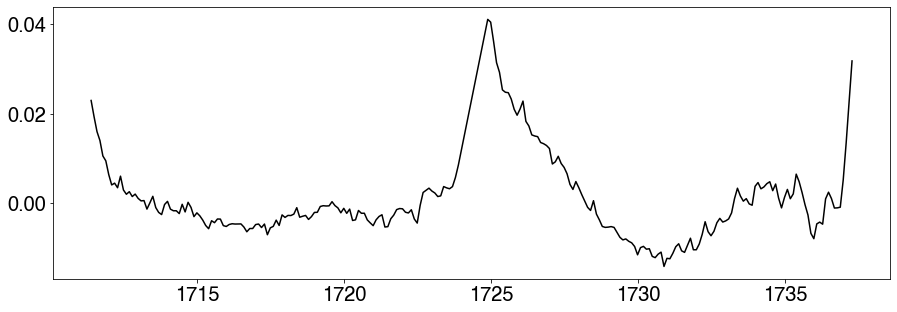

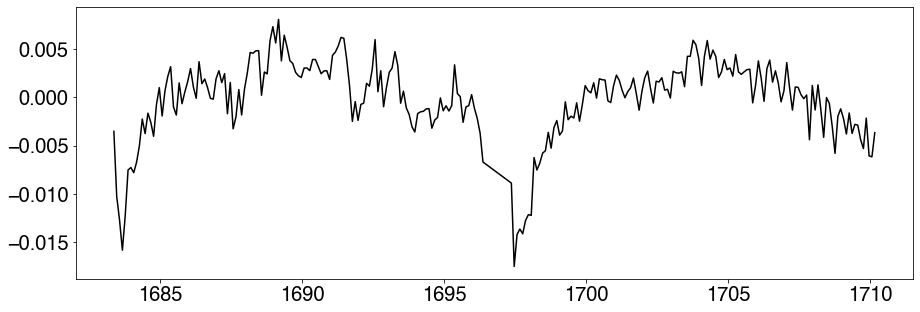

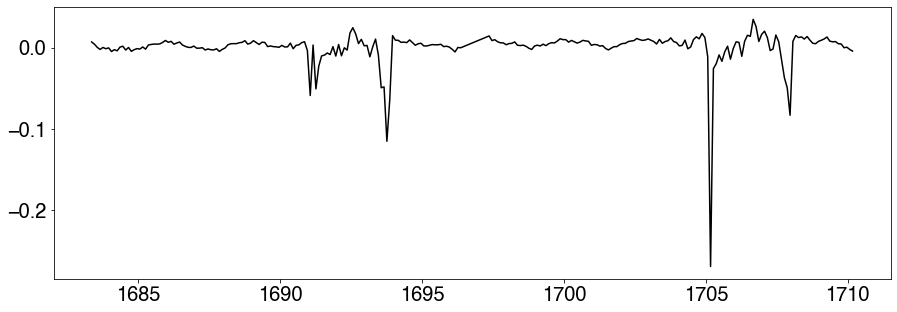

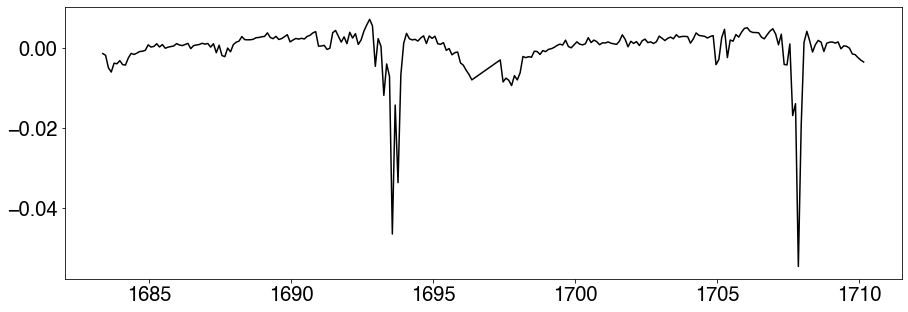

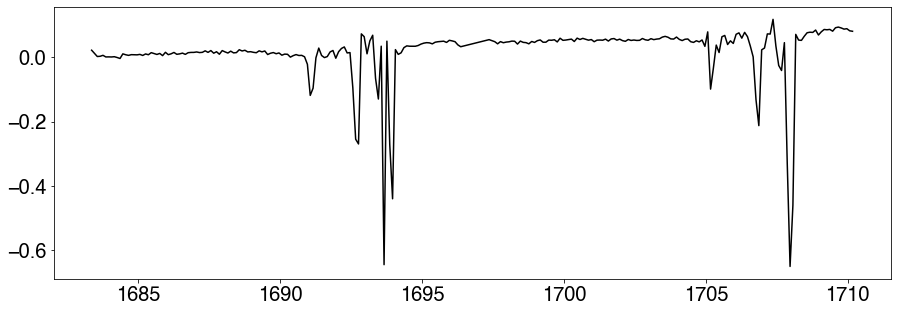

...

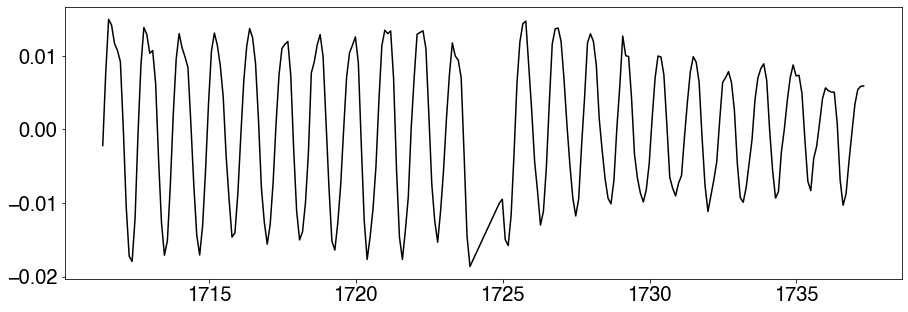

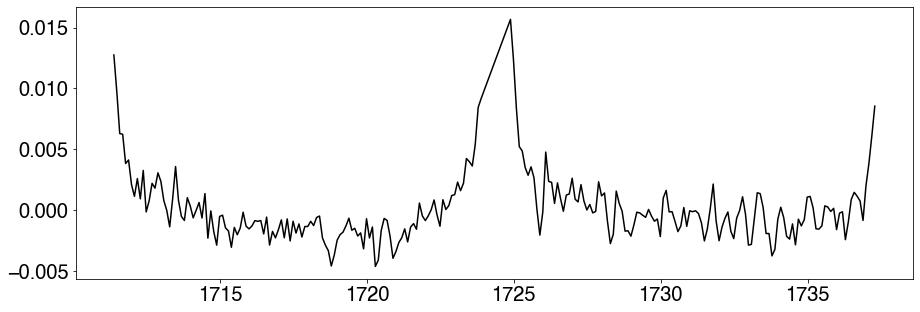

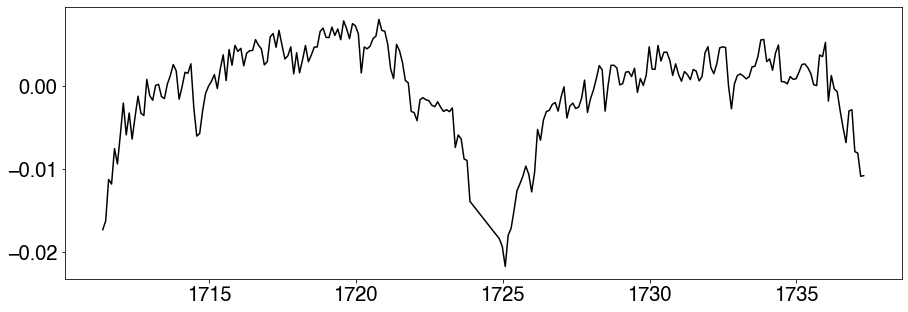

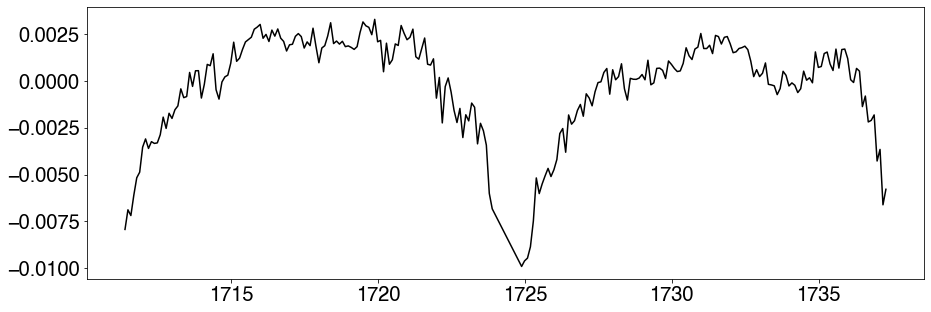

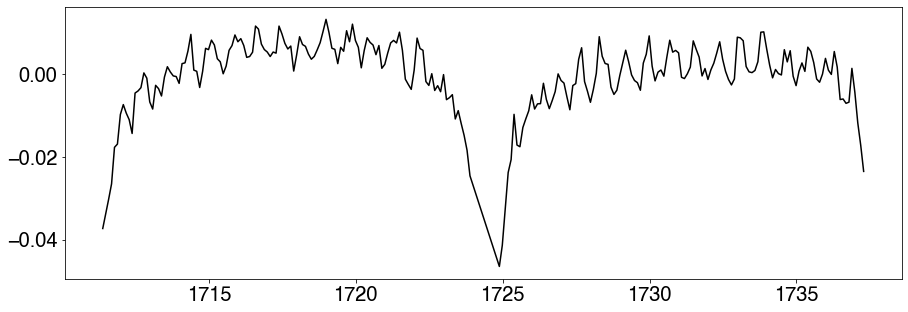

In [51]:
ls_periods_cbvs_flux = []
pdm_periods_cbvs_flux = []
exo_periods_cbvs_flux = []

for each, tic in enumerate(tics_short_periods[0:61]): 
    star = eleanor.Source(tic=tic)
    data = eleanor.TargetData(star, do_psf=True, do_pca=True)
    index = np.where(np.array(tics_short_periods) == tic)
    mcq_period = short_periods[index[0][0]]
    
    q = data.quality == 0
    data.cbvs = np.zeros_like(data.cbvs)
    data.centroid_xs = np.zeros_like(data.centroid_xs)
    data.centroid_ys = np.zeros_like(data.centroid_ys)

    corr_flux = eleanor.TargetData.corrected_flux(data, flux=data.raw_flux)
   
    try: 
        time = data.time[q]    
        norm_flux = corr_flux[q]/np.nanmedian(corr_flux[q])
        norm_flux_err = np.sqrt(norm_flux)
    
        resid = residuals(time, norm_flux, norm_flux_err)
        resid = resid[~np.isnan(resid)]
        time = time[~np.isnan(resid)]
        
        #linear interpolation
        f = interpolate.interp1d(time, resid)
        xnew = np.arange(time[0], time[-1], 0.1)
        flux = f(xnew) 
        flux_err = np.sqrt(flux)
    
    
        plt.figure(figsize=(15,5))
        plt.plot(xnew, flux, 'k')
        fig.savefig('tess_{0}_corr_flux.jpg'.format(each))
        plt.close(fig)

        #exo acf
        ex_1 = exoplanet.autocorr_estimator(xnew, flux, yerr= flux_err, min_period = 0.1, max_period = 15)
        exo_period = ex_1['peaks'][0]['period'] 
        exo_periods_cbvs_flux.append(exo_period)
        
        
        #lomb-scargle 
        rotate_el = ss.RotationModel(xnew, flux, flux_err)
        ls_period = rotate_el.ls_rotation()
        ls_periods_cbvs_flux.append(ls_period)
        
        #pdm 
        period_grid = np.linspace(.1, 10, 1000)
        pdm_period, period_err = rotate_el.pdm_rotation(period_grid, pdm_nbins=10)
        pdm_periods_cbvs_flux.append(pdm_period)
        print('works!')
        
        
    except : 
        print('error')
        ls_periods_cbvs_flux.append(0)
        pdm_periods_cbvs_flux.append(0)
        exo_periods_cbvs_flux.append(0)

In [53]:
ls_diff_cbvs = []
exo_diff_cbvs = []
pdm_diff_cbvs = []

for each, value in enumerate(short_periods[0:31]):
    ls_diff_cbvs.append(np.abs(ls_periods_cbvs_flux[each]-value))
    exo_diff_cbvs.append(np.abs(exo_periods_cbvs_flux[each]-value))
    pdm_diff_cbvs.append(np.abs(pdm_periods_cbvs_flux[each]-value))

(array([3., 5., 4., 2., 2., 3., 3., 1., 4., 4.]),
 array([2.87697283e-03, 1.33669933e+00, 2.67052168e+00, 4.00434404e+00,
        5.33816639e+00, 6.67198875e+00, 8.00581110e+00, 9.33963346e+00,
        1.06734558e+01, 1.20072782e+01, 1.33411005e+01]),
 <a list of 10 Patch objects>)

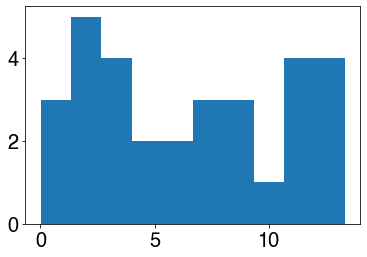

In [54]:
plt.hist(ls_diff_cbvs)

(array([6., 2., 5., 3., 2., 3., 1., 6., 1., 2.]),
 array([ 0.02 ,  1.149,  2.278,  3.407,  4.536,  5.665,  6.794,  7.923,
         9.052, 10.181, 11.31 ]),
 <a list of 10 Patch objects>)

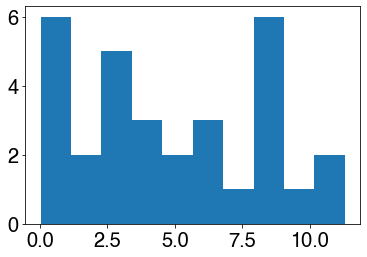

In [55]:
plt.hist(exo_diff_cbvs)

(array([4., 6., 7., 4., 1., 1., 1., 2., 2., 3.]),
 array([ 0.01279279,  1.19269369,  2.37259459,  3.5524955 ,  4.7323964 ,
         5.9122973 ,  7.0921982 ,  8.2720991 ,  9.452     , 10.6319009 ,
        11.8118018 ]),
 <a list of 10 Patch objects>)

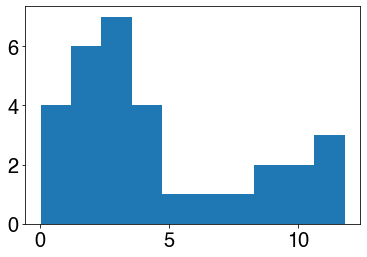

In [56]:
plt.hist(pdm_diff_cbvs)

# straight up removing places with seemingly bad data

# test 

No eleanor postcard has been made for your target (yet). Using TessCut instead.


100%|██████████| 1241/1241 [00:28<00:00, 44.31it/s]


3.5499999999967713


  7%|▋         | 74/1000 [00:00<00:01, 735.37it/s]

6.690149325626205


100%|██████████| 1000/1000 [00:01<00:00, 981.38it/s]


7.036936936936938


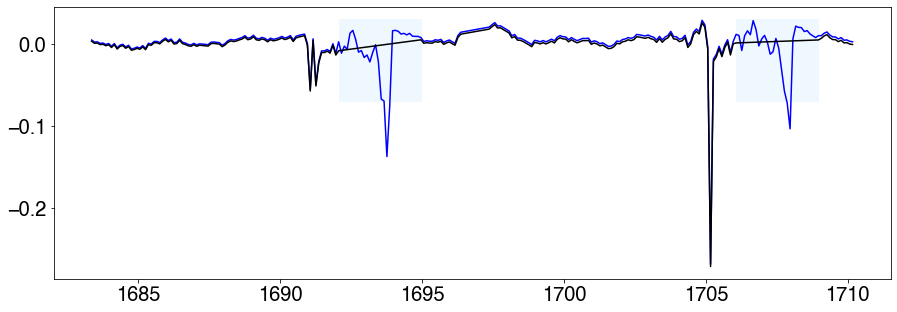

In [36]:
star = eleanor.Source(tic=tics_short_periods[2])
data = eleanor.TargetData(star, do_psf=True, do_pca=True)

q = data.quality == 0
time = data.time[q] 
flux_nan = (data.pca_flux[q])[~np.isnan(data.pca_flux[q])]
norm_flux = flux_nan/np.nanmedian(data.pca_flux[q])

#original 
norm_flux_err = np.sqrt(norm_flux)
resid = residuals(time, norm_flux, norm_flux_err)
resid = resid[~np.isnan(resid)]
time = time[~np.isnan(resid)]   
        
f = interpolate.interp1d(time, resid)
xnew = np.arange(time[0], time[-1], 0.1)
flux = f(xnew) 
flux_err = np.sqrt(flux)

#cropping out section
mask = (time <= 1695) & (time >= 1692)
norm_flux_2 = norm_flux[~mask]
time_masked = time[~mask]

mask_2 = (time_masked <= 1709) & (time_masked >= 1706)
norm_flux_mask = norm_flux_2[~mask_2]
time_mask = time_masked[~mask_2]

#removing trends 
norm_flux_err_mask = np.sqrt(norm_flux_mask)
resid_mask = residuals(time_mask, norm_flux_mask, norm_flux_err_mask)
resid_mask = resid_mask[~np.isnan(resid_mask)]
time_mask = time_mask[~np.isnan(resid_mask)]   
        
#linear interpolation
f = interpolate.interp1d(time_mask, resid_mask)
xnew_mask = np.arange(time_mask[0], time_mask[-1], 0.1)
flux_mask = f(xnew_mask) 
flux_err_mask = np.sqrt(flux_mask)
    
plt.figure(figsize=(15,5))
plt.plot(xnew, flux, 'royalblue')
plt.fill_between(xnew, -0.07, 0.03,
                 where = (xnew > 1692) & (xnew <= 1695), 
                 color = 'aliceblue') 
plt.fill_between(xnew, -0.07, 0.03,
                 where = (xnew > 1706) & (xnew <= 1709), 
                 color = 'aliceblue')

plt.plot(xnew_mask, flux_mask, 'k')

#exo acf
ex_1 = exoplanet.autocorr_estimator(xnew_mask, flux_mask, yerr= flux_err_mask, min_period = 0.1, max_period = 15)
exo_period = ex_1['peaks'][0]['period'] 
print(exo_period)
        
#lomb-scargle 
rotate_el = ss.RotationModel(xnew_mask, flux_mask, flux_err_mask)
ls_period = rotate_el.ls_rotation()
print(ls_period)
        
#pdm 
period_grid = np.linspace(.1, 10, 1000)
pdm_period, period_err = rotate_el.pdm_rotation(period_grid, pdm_nbins=10)
print(pdm_period)

No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:24<00:00, 48.03it/s]

100%|██████████| 1000/1000 [00:01<00:00, 693.42it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:33<00:00, 36.63it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1360.75it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:41<00:00, 29.77it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]


100%|██████████| 1000/1000 [00:00<00:00, 1118.24it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



 92%|█████████▏| 1144/1241 [00:44<00:05, 16.43it/s]


100%|██████████| 1241/1241 [00:48<00:00, 25.47it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1430.91it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:39<00:00, 31.20it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1918.79it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:21<00:00, 59.02it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1840.37it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:27<00:00, 45.03it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1918.20it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



 87%|████████▋ | 1047/1197 [00:20<00:03, 38.62it/s]


100%|██████████| 1197/1197 [00:23<00:00, 51.78it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1323.95it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:23<00:00, 50.98it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1613.85it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:24<00:00, 49.83it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1868.73it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:23<00:00, 50.46it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1482.87it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:25<00:00, 47.39it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1236.26it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:32<00:00, 37.36it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1968.64it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:39<00:00, 30.04it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1644.82it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:36<00:00, 33.68it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1577.57it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



 59%|█████▉    | 734/1241 [00:58<01:25,  5.91it/s]


 83%|████████▎ | 1036/1241 [01:52<00:37,  5.42it/s]


100%|██████████| 1241/1241 [02:28<00:00,  8.34it/s]


error
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:41<00:00, 29.86it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1544.33it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:37<00:00, 32.25it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1689.55it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:26<00:00, 45.21it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1705.97it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:37<00:00, 31.77it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1375.83it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:27<00:00, 43.29it/s]

100%|██████████| 1000/1000 [00:01<00:00, 647.52it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:32<00:00, 36.49it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1733.25it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:23<00:00, 51.59it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1715.04it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



 82%|████████▏ | 977/1197 [00:46<00:05, 39.58it/s]


100%|██████████| 1197/1197 [00:53<00:00, 22.26it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1665.42it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:25<00:00, 47.39it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1754.74it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:35<00:00, 34.09it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1732.74it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:29<00:00, 40.99it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1957.72it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:22<00:00, 52.41it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1841.75it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:38<00:00, 30.86it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1303.14it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:37<00:00, 31.69it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1106.39it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:39<00:00, 30.28it/s]

100%|██████████| 1000/1000 [00:01<00:00, 855.29it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



 99%|█████████▉| 1183/1197 [00:44<00:00, 32.67it/s]


100%|██████████| 1197/1197 [00:45<00:00, 26.25it/s]

100%|██████████| 1000/1000 [00:01<00:00, 584.81it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:43<00:00, 27.60it/s]

 28%|██▊       | 278/1000 [00:00<00:00, 890.44it/s]


100%|██████████| 1000/1000 [00:01<00:00, 886.36it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



 84%|████████▍ | 1007/1197 [00:46<00:06, 28.07it/s]


100%|██████████| 1197/1197 [00:52<00:00, 22.71it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1332.34it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:34<00:00, 34.76it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1602.65it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



 27%|██▋       | 320/1197 [00:47<02:23,  6.13it/s]


 52%|█████▏    | 622/1197 [01:33<01:15,  7.62it/s]


 78%|███████▊  | 938/1197 [02:35<00:30,  8.61it/s]


100%|██████████| 1197/1197 [03:13<00:00,  6.19it/s]


error
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:34<00:00, 36.30it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1671.33it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



 27%|██▋       | 321/1197 [00:49<02:09,  6.76it/s]


100%|██████████| 1197/1197 [01:10<00:00, 16.90it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1610.72it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:29<00:00, 41.66it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1651.82it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:31<00:00, 38.21it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1618.35it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:29<00:00, 42.28it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1753.19it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



 27%|██▋       | 323/1197 [00:44<01:40,  8.66it/s]


 52%|█████▏    | 625/1197 [01:26<01:59,  4.78it/s]


 77%|███████▋  | 927/1197 [02:16<00:43,  6.19it/s]


100%|██████████| 1197/1197 [03:12<00:00,  6.22it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1732.39it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:35<00:00, 33.29it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1747.58it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:30<00:00, 39.04it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1746.61it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:42<00:00, 28.16it/s]

 55%|█████▍    | 546/1000 [00:00<00:00, 1103.84it/s]


100%|██████████| 1000/1000 [00:00<00:00, 1058.16it/s]A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:36<00:00, 33.06it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1588.76it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:28<00:00, 41.46it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1739.15it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:37<00:00, 33.01it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1520.70it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:31<00:00, 39.23it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1727.31it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:30<00:00, 38.86it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1568.38it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:29<00:00, 40.02it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1604.03it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:29<00:00, 40.81it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1612.01it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:34<00:00, 35.94it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1635.63it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:35<00:00, 35.02it/s]


error
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:35<00:00, 34.01it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1746.26it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:36<00:00, 34.19it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1503.65it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:29<00:00, 42.33it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1481.39it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1241/1241 [00:33<00:00, 36.61it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1711.22it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:29<00:00, 40.86it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1703.59it/s][A


fitting to a limited range
works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:30<00:00, 38.91it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1718.28it/s][A


works!
No eleanor postcard has been made for your target (yet). Using TessCut instead.



100%|██████████| 1197/1197 [00:33<00:00, 35.39it/s]

100%|██████████| 1000/1000 [00:00<00:00, 1574.37it/s][A


works!


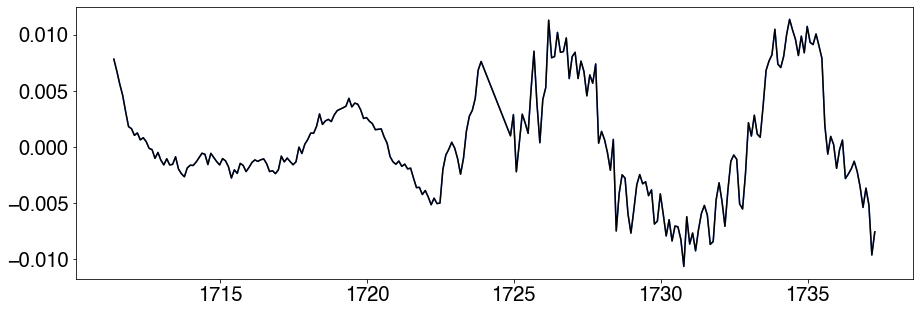

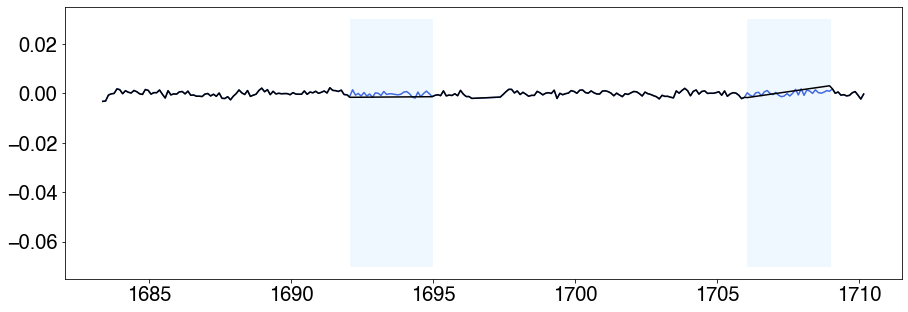

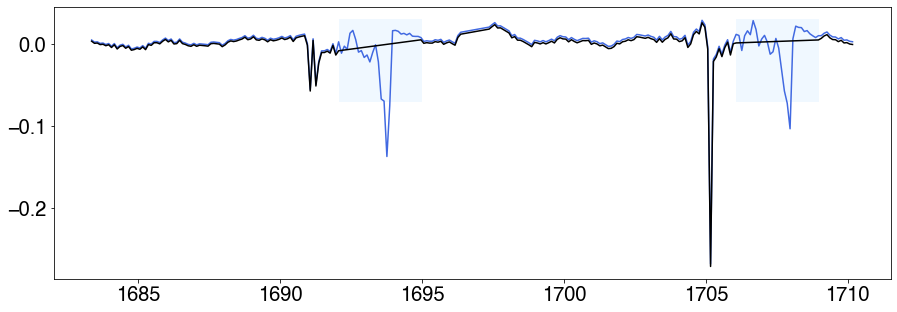

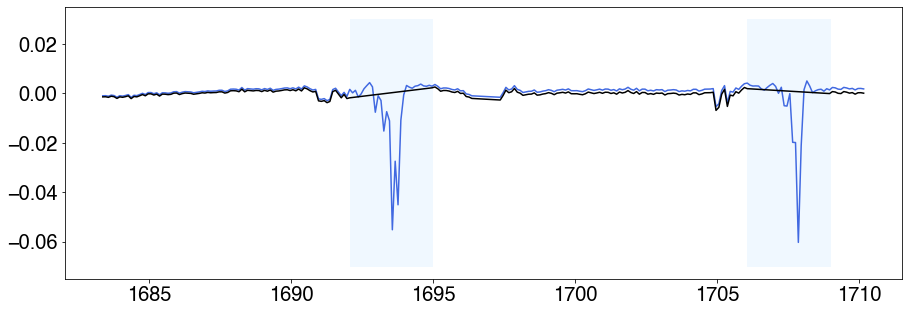

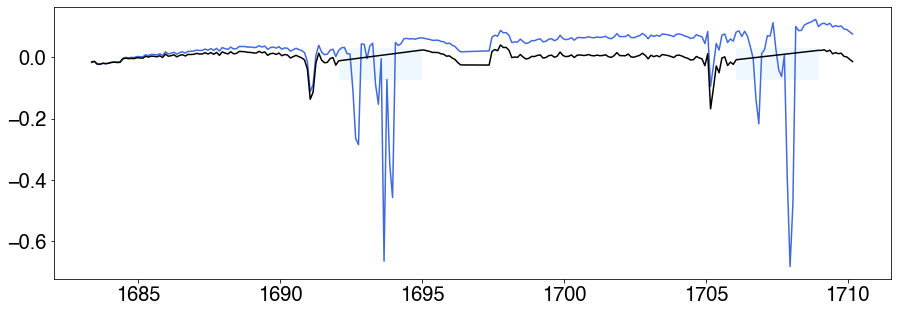

...

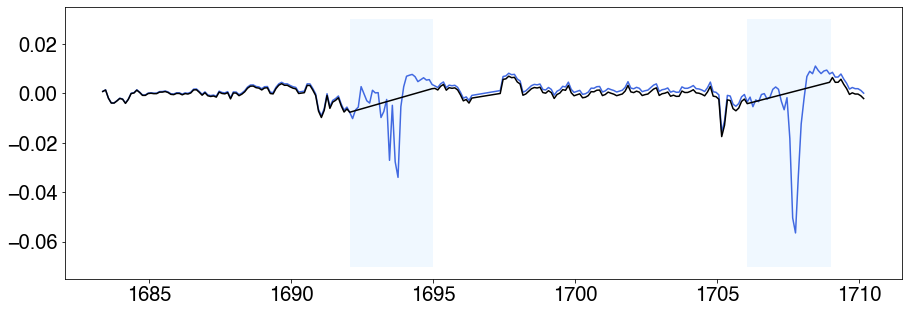

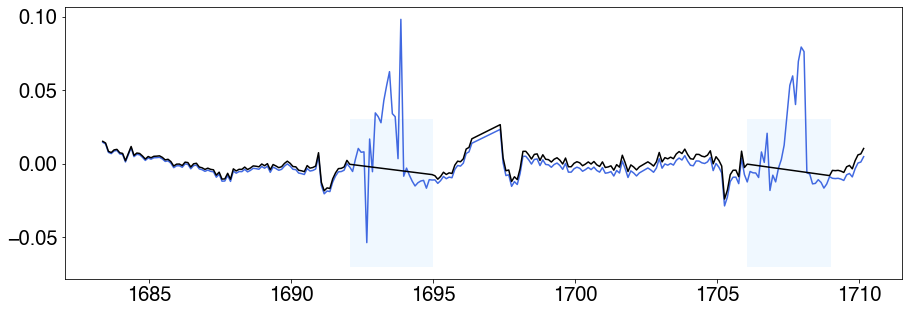

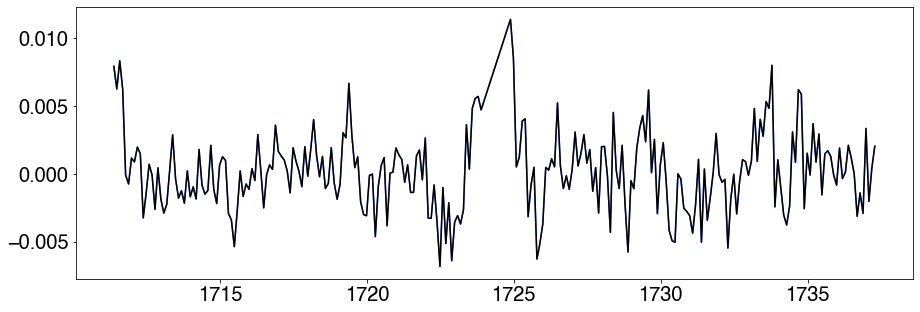

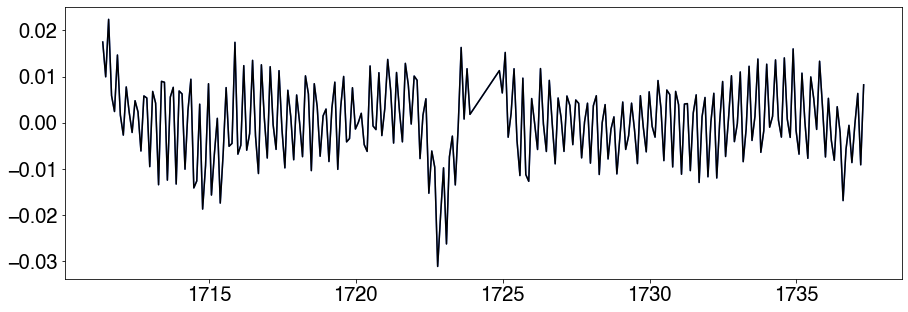

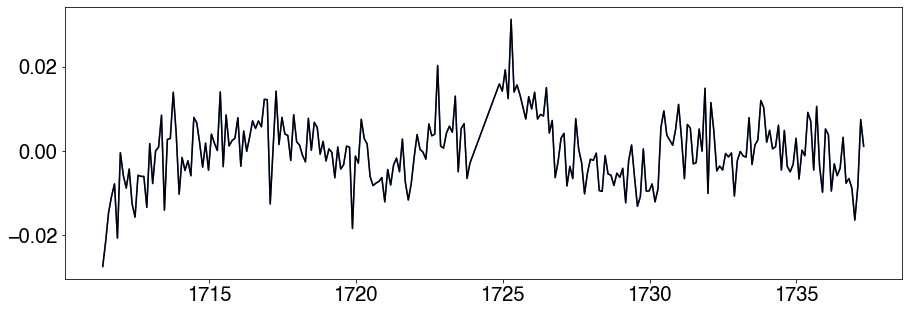

In [40]:
ls_periods_rem_flux = []
pdm_periods_rem_flux = []
exo_periods_rem_flux = []

for each, tic in enumerate(tics_short_periods[0:61]): 
    star = eleanor.Source(tic=tic)
    data = eleanor.TargetData(star, do_psf=True, do_pca=True)
    index = np.where(np.array(tics_short_periods) == tic)
    mcq_period = short_periods[index[0][0]]
    
    q = data.quality == 0
    time = data.time[q] 
    flux_nan = (data.pca_flux[q])[~np.isnan(data.pca_flux[q])]
    norm_flux = flux_nan/np.nanmedian(data.pca_flux[q])
   
    try: 
    #original 
        norm_flux_err = np.sqrt(norm_flux)
        resid = residuals(time, norm_flux, norm_flux_err)
        resid = resid[~np.isnan(resid)]
        time = time[~np.isnan(resid)]   
        
        f = interpolate.interp1d(time, resid)
        xnew = np.arange(time[0], time[-1], 0.1)
        flux = f(xnew) 
        flux_err = np.sqrt(flux)

        #cropping out section
        mask = (time <= 1695) & (time >= 1692)
        norm_flux_2 = norm_flux[~mask]
        time_masked = time[~mask]
    
        mask_2 = (time_masked <= 1709) & (time_masked >= 1706)
        norm_flux_mask = norm_flux_2[~mask_2]
        time_mask = time_masked[~mask_2]

        #removing trends 
        norm_flux_err_mask = np.sqrt(norm_flux_mask)
        resid_mask = residuals(time_mask, norm_flux_mask, norm_flux_err_mask)
        resid_mask = resid_mask[~np.isnan(resid_mask)]
        time_mask = time_mask[~np.isnan(resid_mask)]   
        
        #linear interpolation
        f = interpolate.interp1d(time_mask, resid_mask)
        xnew_mask = np.arange(time_mask[0], time_mask[-1], 0.1)
        flux_mask = f(xnew_mask) 
        flux_err_mask = np.sqrt(flux_mask)
    
        fig, axs = plt.subplots()
        fig.tight_layout(h_pad=6)
        plt.figure(figsize=(15,5))
        plt.plot(xnew, flux, 'royalblue')
        plt.fill_between(xnew, -0.07, 0.03,
                 where = (xnew > 1690) & (xnew <= 1695), 
                 color = 'aliceblue') 
        plt.fill_between(xnew, -0.07, 0.03,
                 where = (xnew > 1704) & (xnew <= 1709), 
                 color = 'aliceblue')

        plt.plot(xnew_mask, flux_mask, 'k')
        fig.savefig('tess_{0}_rem_flux.jpg'.format(each))
        plt.close(fig)

        #exo acf
        ex_1 = exoplanet.autocorr_estimator(xnew_mask, flux_mask, yerr= flux_err_mask, min_period = 0.1, max_period = 15)
        exo_period = ex_1['peaks'][0]['period']
        exo_periods_rem_flux.append(exo_period)

        
        #lomb-scargle 
        rotate_el = ss.RotationModel(xnew_mask, flux_mask, flux_err_mask)
        ls_period = rotate_el.ls_rotation()
        ls_periods_rem_flux.append(ls_period)
       
        #pdm 
        period_grid = np.linspace(.1, 10, 1000)
        pdm_period, period_err = rotate_el.pdm_rotation(period_grid, pdm_nbins=10)    
        pdm_periods_rem_flux.append(pdm_period)
        print('works!')
    
        
    except : 
        print('error')
        ls_periods_rem_flux.append(0)
        pdm_periods_rem_flux.append(0)
        exo_periods_rem_flux.append(0)

In [50]:
print(short_periods[0:61])

[7.0, 8.88, 2.85, 10.69, 8.74, 12.83, 6.72, 2.67, 6.41, 2.81, 2.19, 10.68, 11.96, 7.7, 3.56, 8.6, 3.72, 11.19, 10.5, 0.84, 3.32, 1.54, 1.37, 12.11, 10.51, 3.2, 11.11, 1.18, 5.62, 1.85, 3.83, 2.38, 2.7, 12.12, 8.23, 3.54, 8.01, 6.32, 11.72, 7.97, 1.45, 12.32, 2.78, 10.03, 1.45, 1.68, 3.15, 0.57, 1.18, 6.4, 2.99, 0.96, 6.24, 7.59, 3.91, 6.42, 1.03, 8.52, 9.73, 9.44, 8.54]


In [51]:
print(exo_periods_rem_flux)

[7.899999999992815, 3.4999999999968168, 3.5499999999967713, 5.29999999999518, 5.899999999994634, 7.999999999992724, 1.7499999999984084, 5.549999999994952, 3.699999999996635, 6.549999999994043, 7.599999999993088, 1.0999999999989996, 7.8499999999928605, 3.2999999999969987, 2.849999999997408, 0, 3.699999999996635, 2.749999999997499, 2.8999999999973625, 0.7999999999992724, 8.549999999992224, 1.6999999999984539, 1.3499999999987722, 7.749999999992951, 1.9499999999982265, 2.1499999999980446, 0.949999999999136, 1.149999999998954, 4.0499999999963165, 1.799999999998363, 4.0499999999963165, 2.399999999997817, 13.14999999998804, 3.1999999999970896, 2.5999999999976353, 0, 1.999999999998181, 6.29999999999427, 7.499999999993179, 1.6999999999984539, 1.4499999999986812, 3.599999999996726, 1.3499999999987722, 7.249999999993406, 2.8999999999973625, 1.6499999999984993, 3.4499999999968622, 0.5499999999994998, 5.74999999999477, 4.549999999995862, 5.249999999995225, 7.9499999999927695, 1.3499999999987722, 0,

In [41]:
x = short_periods[0:61]
y =  exo_periods_rem_flux

source = ColumnDataSource(data=dict(
    x =  short_periods[0:61],
    y = exo_periods_rem_flux,
    ls = ls_periods_rem_flux, 
    tess = (cat['tic_id'])[0:61]))

x2 = [i*2 for i in x]
x_half = [float(i)*0.5 for i in x]

exo_rem_plot = figure(
   tools="pan,box_zoom,reset,save,hover",
   y_range=[0, 15], title="Exo Periods from Flux with Flags Removed",
   x_axis_label='McQuillan Period', y_axis_label='Exo Period', plot_width=900)

exo_rem_plot.line(x, x, name = "y=x", color = 'lightsteelblue', line_dash="4 4", legend = "y=x", line_width = 2)
exo_rem_plot.circle('x', 'y', source = source, color="mediumvioletred", line_color=None)
exo_rem_plot.line(x, x_half, legend="y=2x", line_width=1, color = 'khaki', line_dash="dotted")
exo_rem_plot.line(x, x2, legend="y=2x", line_width=1, color = 'khaki', line_dash="dotted")

exo_rem_plot.hover.tooltips = [
    ("index", "$index"), 
    ("(x,y)", "($x, $y)"), 
    ("ls", "$ls"),
    ("TESS", "$tess")] 

show(exo_rem_plot)

In [42]:
x = short_periods[0:61]
y =  ls_periods_rem_flux

source = ColumnDataSource(data=dict(
    x =  short_periods[0:61],
    y = ls_periods_rem_flux[0:61],
    tess = (cat['tic_id'])[0:61]))

x2 = [i*2 for i in x]
x_half = [float(i)*0.5 for i in x]

ls_rem_plot = figure(
   tools="pan,box_zoom,reset,save,hover",
   y_range=[0, 15], title="LS Periods from Flux with Flags Removed",
   x_axis_label='McQuillan Period', y_axis_label='LS Period', plot_width=900)

ls_rem_plot.line(x, x, name = "y=x", color = 'lightsteelblue', line_dash="4 4", legend = "y=x", line_width = 2)
ls_rem_plot.circle('x', 'y', source = source, color="mediumvioletred", line_color=None)
ls_rem_plot.line(x, x_half, legend="y=2x", line_width=1, color = 'khaki', line_dash="dotted")
ls_rem_plot.line(x, x2, legend="y=2x", line_width=1, color = 'khaki', line_dash="dotted")

ls_rem_plot.hover.tooltips = [
    ("index", "$index"), 
    ("(x,y)", "($x, $y)"), 
    ("TESS", "$tess")] 

show(ls_rem_plot)

In [43]:
x = short_periods[0:61]
y =  pdm_periods_rem_flux

source = ColumnDataSource(data=dict(
    x =  short_periods[0:61],
    y = pdm_periods_rem_flux[0:61],
    tess = (cat['tic_id'])[0:61]))

x2 = [i*2 for i in x]
x_half = [float(i)*0.5 for i in x]

pdm_rem_plot = figure(
   tools="pan,box_zoom,reset,save,hover",
   y_range=[0, 15], title="PDM Periods from Flux with Flags Removed",
   x_axis_label='McQuillan Period', y_axis_label='PDM Period', plot_width=900)

pdm_rem_plot.line(x, x, name = "y=x", color = 'lightsteelblue', line_dash="4 4", legend = "y=x", line_width = 2)
pdm_rem_plot.circle('x', 'y', source = source, color="mediumvioletred", line_color=None)
pdm_rem_plot.line(x, x_half, legend="y=2x", line_width=1, color = 'khaki', line_dash="dotted")
pdm_rem_plot.line(x, x2, legend="y=2x", line_width=1, color = 'khaki', line_dash="dotted")

pdm_rem_plot.hover.tooltips = [
    ("index", "$index"), 
    ("(x,y)", "($x, $y)"), 
    ("TESS", "$tess")] 

show(pdm_rem_plot)

In [44]:
ls_diff_rem = []
exo_diff_rem = []
pdm_diff_rem = []

for each, value in enumerate(short_periods[0:61]):
    ls_diff_rem.append(np.abs(ls_periods_rem_flux[each]-value))
    exo_diff_rem.append(np.abs(exo_periods_rem_flux[each]-value))
    pdm_diff_rem.append(np.abs(pdm_periods_rem_flux[each]-value))

(array([11.,  9.,  8.,  0.,  6.,  4.,  8.,  3.,  6.,  6.]),
 array([ 0.57 ,  1.796,  3.022,  4.248,  5.474,  6.7  ,  7.926,  9.152,
        10.378, 11.604, 12.83 ]),
 <a list of 10 Patch objects>)

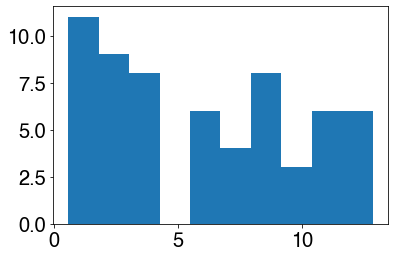

In [45]:
plt.hist(short_periods[0:61])

(array([18.,  7.,  5.,  4.,  8.,  6.,  3.,  2.,  5.,  3.]),
 array([1.31872291e-12, 1.04500000e+00, 2.09000000e+00, 3.13500000e+00,
        4.18000000e+00, 5.22500000e+00, 6.27000000e+00, 7.31500000e+00,
        8.36000000e+00, 9.40500000e+00, 1.04500000e+01]),
 <a list of 10 Patch objects>)

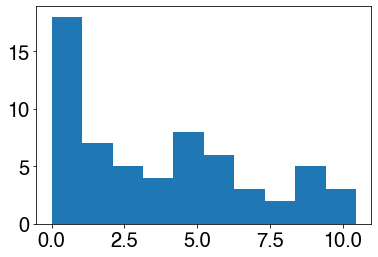

In [46]:
plt.hist(exo_diff_rem)

(-1, 12)

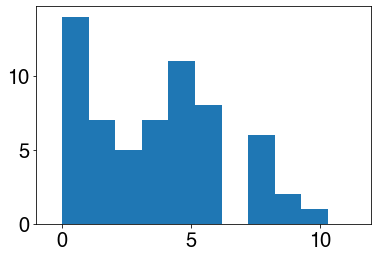

In [47]:
plt.hist(ls_diff_rem)
plt.xlim(-1,12)

(array([17.,  9.,  3., 12.,  9.,  2.,  3.,  3.,  2.,  1.]),
 array([4.23423423e-03, 1.15512613e+00, 2.30601802e+00, 3.45690991e+00,
        4.60780180e+00, 5.75869369e+00, 6.90958559e+00, 8.06047748e+00,
        9.21136937e+00, 1.03622613e+01, 1.15131532e+01]),
 <a list of 10 Patch objects>)

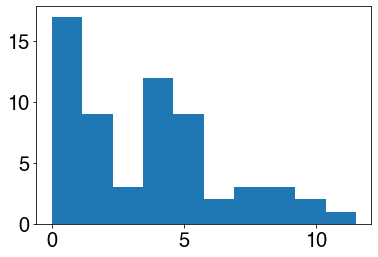

In [48]:
plt.hist(pdm_diff_rem)